# Machine Learning Application to Nuclear Binding Energies

In [1]:
#Importing essentials
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import pandas as pd
import seaborn as sns
import math as math
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import norm
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import normalize
from sklearn.metrics import mean_squared_error
from mpl_toolkits import mplot3d


#Graph Settings
fig_size = plt.rcParams["figure.figsize"]
# Prints: [8.0, 6.0]
#print ("Current size:", fig_size)
# Set figure width to 12 and height to 9
fig_size[0] = 15
fig_size[1] =20
plt.rcParams["figure.figsize"] = fig_size

name=["SKMS", "SKP","SLY4","SV-MIN","UNEDF0","UNEDF1",]



### Getting Experimental Binding Energies

In [2]:
#importing from experimental file
# Num Nuc  A   N   Z        E        E/A     dE     Eval    S1n     dS1n  Eval    
# 0   1    2   3   4        5        6       7      8       9       10    11

#S1p     dS1p  Eval    S2n     dS2n  Eval    S2p     dS2p  Eval
#12      13    14      15      16    17      18      19    20


exp_energies = np.loadtxt('EXPERIMENT_AME2016-Copy1.dat',usecols=(3,4,5))

exp_energies=np.transpose(exp_energies)
exp_energies[2]=-exp_energies[2]
exp_energies=np.transpose(exp_energies)


### removing all experimental nucei except those between z=20 and z=92 

In [3]:
exp_energies_d={}
exp_range_d={}


exp_range = exp_energies[np.where(exp_energies[:,1] >= 20)] #remove all nuclei with Z < 20
exp_range = exp_range[np.where(exp_range[:,1] <= 92 )] #remove all nuclei with Z > 92
exp_range = exp_range[np.where(exp_range[:,0] >= 20 )] #remove all nuclei with N < 20
#exp_range = exp_range[np.where(exp_range[:,0] <= 240-92 )] #remove all nuclei with N > 240-92
#remove all nuclei with Z < 20print(len(exp_range))


for exp_energies_i in exp_energies:
    exp_energies_d[exp_energies_i[0],exp_energies_i[1]]=exp_energies_i[2]
    
for exp_range_i in exp_range:
    exp_range_d[exp_range_i[0],exp_range_i[1]]=exp_range_i[2]



# Theoretical Values

In [4]:
#theoretical importing relevent data
#Symbol Z  N A Binding_Energy_(MeV)  S_p_(MeV)  S_{2p}_(MeV) S_n_(MeV)  S_{2n}_(MeV) Q_{alpha}_(MeV)       
#0      1  2 3 4                     5          6            7          8            9

the_energies= [[],[], [], [], [], [],]

the_names   =['SKMS_all_nuclei-new-Copy1.dat',
              'SKP_all_nuclei-Copy1.dat',
              'SLY4_all_nuclei-new-Copy1.dat',
              'SV-MIN_all_nuclei-new-Copy1.dat',
              'UNEDF0_all_nuclei-new-Copy1.dat',
              'UNEDF1_all_nuclei-new-Copy1.dat']

#the_energies: Z,N,T_BE,Q,S_n,S_p

the_energies[0] = np.genfromtxt('SKMS_all_nuclei-new-Copy1.dat',usecols=(2,1,4,9,7,5))   
the_energies[1] = np.genfromtxt('SKP_all_nuclei-Copy1.dat',usecols=(2,1,4,9,7,5))
the_energies[2] = np.genfromtxt('SLY4_all_nuclei-new-Copy1.dat',usecols=(2,1,4,9,7,5))
the_energies[3] = np.genfromtxt('SV-MIN_all_nuclei-new-Copy1.dat',usecols=(2,1,4,9,7,5))
the_energies[4] = np.genfromtxt('UNEDF0_all_nuclei-new-Copy1.dat',usecols=(2,1,4,9,7,5))
the_energies[5] = np.genfromtxt('UNEDF1_all_nuclei-new-Copy1.dat',usecols=(2,1,4,9,7,5))

  
    



for i in range(0,6):   
    the_energies[i]=np.transpose(the_energies[i])
    the_energies[i][2]=-the_energies[i][2]
    the_energies[i]=np.transpose(the_energies[i])
    #print(len(the_energies[i]))
 
   

### removing all Theoretical nucei except those between z=20 and z=92 

In [5]:
the_range     =[[],[],[],[],[],[],]
the_range_d   =[{},{},{},{},{},{},]

the_energies_d   =[{},{},{},{},{},{},]

    
for i in range(0,6):
    the_range[i] = the_energies[i][np.where(the_energies[i][:,1] >= 20)] #remove all nuclei with Z < 20

    
    the_range[i] = the_range[i][np.where(the_range[i][:,1] <= 92 )] #remove all nuclei with Z > 92
    the_range[i] = the_range[i][np.where(the_range[i][:,0] >= 20 )] #remove all nuclei with N < 20
    #the_range[i] = the_range[i][np.where(the_range[i][:,0] <= 240-92 )] #remove all nuclei with N > 240-92
    #remove all nuclei with Z < 20print(len(exp_range))



    
for i in range(0,6):
    
    for the_range_i in the_range[i]:
        #print(np.shape(the_range_i))
        the_range_d[i][the_range_i[0],the_range_i[1]]=the_range_i
        #print(the_range_d[i][the_range_i[0],the_range_i[1]])
        
for i in range(0,6):
    
    for the_energies_i in the_energies[i]:
        #print(np.shape(the_range_i))
        the_energies_d[i][the_energies_i[0],the_energies_i[1]]=the_energies_i
        #print(the_range_d[i][the_range_i[0],the_range_i[1]])
        
    
    
S_2n     =[[],[],[],[],[],[]]
NZ_S_2n  =[[],[],[],[],[],[]]

for i in range(0,6):
    for n in range(2,150):
        try:
            the_energies_d[i][n,50]
            the_energies_d[i][n-2,50]
            
            S_2n[i].append(the_energies_d[i][n,50][2]-the_energies_d[i][n-2,50][2])
            NZ_S_2n[i].append((n,50))
            
        except:
            continue
            




    

    

 # finding where theory and experimental nuclei match and don't match
    

In [6]:
the_exp_mat_energies=[[],[],[],[],[],[]]
the_exp_mat_energies_d=[{},{},{},{},{},{}]

the_exp_mat_range=[[],[],[],[],[],[]]
the_exp_mat_range_d=[{},{},{},{},{},{}]


for i in range(0,6):
    
    
    for exp_energies_i in exp_energies:  
        try:
            the_energies_d[i][exp_energies_i[0],exp_energies_i[1]]
            
            #the_energies: Z,N,T_BE,Q,S_n,S_p
            
            # Neutron, Proton, T_BE, E_BE, difference, Q, S_n, S_p
            the_exp_mat_energies[i].append((exp_energies_i[0],
                                            exp_energies_i[1],
                                            the_energies_d[i][exp_energies_i[0],exp_energies_i[1]][2],
                                            exp_energies_i[2],
                                            the_energies_d[i][exp_energies_i[0],exp_energies_i[1]][2]-exp_energies_i[2],
                                           the_energies_d[i][exp_energies_i[0],exp_energies_i[1]][3],
                                           the_energies_d[i][exp_energies_i[0],exp_energies_i[1]][4],
                                           the_energies_d[i][exp_energies_i[0],exp_energies_i[1]][5]))
            
            the_exp_mat_energies_d[i][exp_energies_i[0],exp_energies_i[1]]=(exp_energies_i[0],
                                                                            exp_energies_i[1],
                                                                            the_energies_d[i][exp_energies_i[0],exp_energies_i[1]][2],
                                                                            exp_energies_i[2],
                                                                            the_energies_d[i][exp_energies_i[0],exp_energies_i[1]][2]-exp_energies_i[2],
                                                                           the_energies_d[i][exp_energies_i[0],exp_energies_i[1]][3],
                                                                           the_energies_d[i][exp_energies_i[0],exp_energies_i[1]][4],
                                                                           the_energies_d[i][exp_energies_i[0],exp_energies_i[1]][5])
            
        except KeyError:
            continue
        

the_no_mat_energies=[[],[],[],[],[],[]]
for i in range(0,6):
    for the_energies_i in the_energies[i]:
        try:
            #print(the_energies_i[0])
            #print(the_energies_i[1])
            
            #print(the_energies_i)
            exp_energies_d[the_energies_i[0],the_energies_i[1]]
            
        except KeyError:
            the_no_mat_energies[i].append(the_energies_i)
            continue

the_no_mat_range=[[],[],[],[],[],[]]
for i in range(0,6):
    for the_range_i in the_range[i]:
        try:
            #print(the_energies_i[0])
            #print(the_energies_i[1])
            
            #print(the_energies_i)
            exp_range_d[the_range_i[0],the_range_i[1]]
            
        except KeyError:
            the_no_mat_range[i].append(the_range_i)
            continue

        
            
            
    
    for exp_range_i in exp_range:  
        try:
            the_range_d[i][exp_range_i[0],exp_range_i[1]]
            
            
            # Neutron, Proton, Theoretical BE, Experimental BE, difference
            the_exp_mat_range[i].append((exp_range_i[0],
                                            exp_range_i[1],
                                            the_range_d[i][exp_range_i[0],exp_range_i[1]][2],
                                            exp_range_i[2],
                                            the_range_d[i][exp_range_i[0],exp_range_i[1]][2]-exp_range_i[2],
                                        the_range_d[i][exp_range_i[0],exp_range_i[1]][3],
                                        the_range_d[i][exp_range_i[0],exp_range_i[1]][4],
                                        the_range_d[i][exp_range_i[0],exp_range_i[1]][5]))
            
            the_exp_mat_range_d[i][exp_range_i[0],exp_range_i[1]]=(exp_range_i[0],
                                                                            exp_range_i[1],
                                                                            the_range_d[i][exp_range_i[0],exp_range_i[1]][2],
                                                                            exp_range_i[2],
                                                                            the_range_d[i][exp_range_i[0],exp_range_i[1]][2]-exp_range_i[2],
                                                                  the_range_d[i][exp_range_i[0],exp_range_i[1]][3],
                                                                  the_range_d[i][exp_range_i[0],exp_range_i[1]][4],
                                                                  the_range_d[i][exp_range_i[0],exp_range_i[1]][5])
            
        except KeyError:
            continue
            

            


# Creating the ndrip region 

In [7]:

ndrip_range=[[],[],[],[],[],[]]
ndrip_range_d=[[],[],[],[],[],[]]
zdrip_range=[[],[],[],[],[],[]]
the_exp_mat_reduced_range=[[],[],[],[],[],[]]



for i in range(0,6):
    #print(np.shape(the_exp_mat_range[i]))
    #print(the_exp_mat_range[i][0][1])
    #print(len(the_exp_mat_range[i]))
    #print(the_exp_mat_range[i][0], "\n")
    
    for j in range(1, len(the_exp_mat_range[i])):
        if the_exp_mat_range[i][j-1][1] != the_exp_mat_range[i][j][1]:
            ndrip_range[i].append(the_exp_mat_range[i][j-1])
            ndrip_range[i].append(the_exp_mat_range[i][j-2])
            ndrip_range[i].append(the_exp_mat_range[i][j-3])
            zdrip_range[i].append(the_exp_mat_range[i][j])
            
            
    ndrip_range[i].append(the_exp_mat_range[i][len(the_exp_mat_range[i])-1])
    ndrip_range[i].append(the_exp_mat_range[i][len(the_exp_mat_range[i])-2])
    ndrip_range[i].append(the_exp_mat_range[i][len(the_exp_mat_range[i])-3])
    zdrip_range[i].append(the_exp_mat_range[i][0])
        
    
    for j in range(1, len(the_exp_mat_range[i])):
        if the_exp_mat_range[i][j-3][1] != the_exp_mat_range[i][j][1]:
            x=1
        else:
            the_exp_mat_reduced_range[i].append(the_exp_mat_range[i][j-3])
        
    

ndrip_energies=[[],[],[],[],[],[]]
ndrip_energies_d=[[],[],[],[],[],[]]
zdrip_energies=[[],[],[],[],[],[]]
the_exp_mat_reduced_energies=[[],[],[],[],[],[]]



for i in range(0,6):
    #print(np.shape(the_exp_mat_range[i]))
    #print(the_exp_mat_range[i][0][1])
    #print(len(the_exp_mat_range[i]))
    #print(the_exp_mat_range[i][0], "\n")
    
    for j in range(1, len(the_exp_mat_energies[i])):
        if the_exp_mat_energies[i][j-1][1] != the_exp_mat_energies[i][j][1]:
            ndrip_energies[i].append(the_exp_mat_energies[i][j-1])
            ndrip_energies[i].append(the_exp_mat_energies[i][j-2])
            ndrip_energies[i].append(the_exp_mat_energies[i][j-3])
            zdrip_energies[i].append(the_exp_mat_energies[i][j])
            
            
    ndrip_energies[i].append(the_exp_mat_energies[i][len(the_exp_mat_energies[i])-1])
    ndrip_energies[i].append(the_exp_mat_energies[i][len(the_exp_mat_energies[i])-2])
    ndrip_energies[i].append(the_exp_mat_energies[i][len(the_exp_mat_energies[i])-3])
    zdrip_energies[i].append(the_exp_mat_energies[i][0])
        
    
    for j in range(1, len(the_exp_mat_energies[i])):
        if the_exp_mat_energies[i][j-3][1] != the_exp_mat_energies[i][j][1]:
            x=1
        else:
            the_exp_mat_reduced_energies[i].append(the_exp_mat_energies[i][j-3])
        
    

    

# Creating energies with no nan values

In [8]:
zdrip_nonan_energies                     =[[],[],[],[],[],[]]
ndrip_nonan_energies                     =[[],[],[],[],[],[]]
the_exp_mat_reduced_nonan_energies       =[[],[],[],[],[],[]]


the_exp_mat_nonan_energies               =[[],[],[],[],[],[]]
the_no_mat_nonan_energies                =[[],[],[],[],[],[]]
the_nonan_energies                       =[[],[],[],[],[],[]]




for i in range(0,6):
    for the_energies_i in the_energies[i]:
        if math.isnan(the_energies_i[0]) or math.isnan(the_energies_i[2]) or math.isnan(the_energies_i[3]) or math.isnan(the_energies_i[4]) or math.isnan(the_energies_i[5]):
           x=1
            #print(the_exp_mat_reduced_energies_i)
            
        else:
            the_nonan_energies[i].append(the_energies_i)
       


for i in range(0,6):
    for the_exp_mat_reduced_energies_i in the_exp_mat_reduced_energies[i]:
        if math.isnan(the_exp_mat_reduced_energies_i[0]) or math.isnan(the_exp_mat_reduced_energies_i[2]) or math.isnan(the_exp_mat_reduced_energies_i[3]) or math.isnan(the_exp_mat_reduced_energies_i[4]) or math.isnan(the_exp_mat_reduced_energies_i[5]) or math.isnan(the_exp_mat_reduced_energies_i[6]) or math.isnan(the_exp_mat_reduced_energies_i[7]):
           x=1
            #print(the_exp_mat_reduced_energies_i)
            
        else:
            the_exp_mat_reduced_nonan_energies[i].append(the_exp_mat_reduced_energies_i)
            
            

for i in range(0,6):
    for the_exp_mat_energies_i in the_exp_mat_energies[i]:
        if math.isnan(the_exp_mat_energies_i[0]) or math.isnan(the_exp_mat_energies_i[2]) or math.isnan(the_exp_mat_energies_i[3]) or math.isnan(the_exp_mat_energies_i[4]) or math.isnan(the_exp_mat_energies_i[5]) or math.isnan(the_exp_mat_energies_i[6]) or math.isnan(the_exp_mat_energies_i[7]):
            x=1
            #print(the_exp_mat_reduced_energies_i)
            
        else:
            the_exp_mat_nonan_energies[i].append(the_exp_mat_energies_i)
            
            

for i in range(0,6):
    for the_no_mat_energies_i in the_no_mat_energies[i]:
        if math.isnan(the_no_mat_energies_i[0]) or math.isnan(the_no_mat_energies_i[2]) or math.isnan(the_no_mat_energies_i[3]) or math.isnan(the_no_mat_energies_i[4]) or math.isnan(the_no_mat_energies_i[5]):
            x=1
            #print(the_exp_mat_reduced_energies_i)
            
        else:
            the_no_mat_nonan_energies[i].append(the_no_mat_energies_i)
            
for i in range(0,6):
    for ndrip_energies_i in ndrip_energies[i]:
        if math.isnan(ndrip_energies_i[0]) or math.isnan(ndrip_energies_i[2]) or math.isnan(ndrip_energies_i[3]) or math.isnan(ndrip_energies_i[4]) or math.isnan(ndrip_energies_i[5]) or math.isnan(ndrip_energies_i[6]) or math.isnan(ndrip_energies_i[7]):
           x=1
            #print(the_exp_mat_reduced_energies_i)
            
        else:
            ndrip_nonan_energies[i].append(ndrip_energies_i)
            
 
for i in range(0,6):
    for zdrip_energies_i in zdrip_energies[i]:
        if math.isnan(zdrip_energies_i[0]) or math.isnan(zdrip_energies_i[2]) or math.isnan(zdrip_energies_i[3]) or math.isnan(zdrip_energies_i[4]) or math.isnan(zdrip_energies_i[5]) or math.isnan(zdrip_energies_i[6]) or math.isnan(zdrip_energies_i[7]):
           x=1
            #print(the_exp_mat_reduced_energies_i)
            
        else:
            zdrip_nonan_energies[i].append(zdrip_energies_i)
            
 

############################################
############################################
############################################

"""
            
for i in range(0,6):
    print("the: ", np.shape(the_energies[i]))
    print("the: ", np.shape(the_nonan_energies[i]), "\n")
    
    
    print("the_exp_mat_reduced: ", np.shape(the_exp_mat_reduced_energies[i]))
    print("the_exp_mat_reduced: ", np.shape(the_exp_mat_reduced_nonan_energies[i]), "\n")
    
    
    print("the_exp_mat: ", np.shape(the_exp_mat_energies[i]))
    print("the_exp_mat: ", np.shape(the_exp_mat_nonan_energies[i]), "\n")
    
    
    print("the_no_mat: ", np.shape(the_no_mat_energies[i]))
    print("the_no_mat: ", np.shape(the_no_mat_nonan_energies[i]), "\n")
            
    print("ndrip: ", np.shape(ndrip_energies[i]))
    print("ndrip: ", np.shape(ndrip_nonan_energies[i]), "\n")
            
    print("zdrip: ", np.shape(zdrip_energies[i]))
    print("zdrip: ", np.shape(zdrip_nonan_energies[i]), "\n")
    
"""


"""
for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #zdrip_nonan_energies[i]=np.transpose(zdrip_energies[i])
    #ndrip_nonan_energies[i]=np.transpose(ndrip_energies[i])
    
    #the_exp_mat_nonan_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    #the_exp_mat_reduced_nonan_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    
    #the_no_mat_nonan_energies[i]=np.transpose(the_no_mat_energies[i])
    
    #the_nonan_energies[i]=np.transpose(the_nonan_energies[i])
    
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    
    print(np.shape(zdrip_nonan_energies[i]))
    print(np.shape(ndrip_nonan_energies[i]))
    print(np.shape(the_exp_mat_nonan_energies[i]))
    print(np.shape(the_exp_mat_reduced_nonan_energies[i]))
    print(np.shape(the_no_mat_nonan_energies[i]))
    print(np.shape(the_nonan_energies[i]))
    
    print(np.shape(zdrip_range[i]))
    print(np.shape(ndrip_range[i]))
    print(np.shape(the_exp_mat_range[i]))
    print(np.shape(the_exp_mat_reduced_range[i]))
    print(np.shape(the_no_mat_range[i]))
    print(np.shape(the_range[i]))
    
"""

'\nfor i in range(0,6):\n    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!\n    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!\n    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!\n    #zdrip_nonan_energies[i]=np.transpose(zdrip_energies[i])\n    #ndrip_nonan_energies[i]=np.transpose(ndrip_energies[i])\n    \n    #the_exp_mat_nonan_energies[i]=np.transpose(the_exp_mat_energies[i]) \n    #the_exp_mat_reduced_nonan_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    \n    #the_no_mat_nonan_energies[i]=np.transpose(the_no_mat_energies[i])\n    \n    #the_nonan_energies[i]=np.transpose(the_nonan_energies[i])\n    \n    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!\n    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!\n    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!\n    \n    print(np.shape(zdrip_nonan_energies[i]))\n    print(np.shape(ndrip_nonan_energies[i]))\n    print(np.shape(the_exp_mat_nonan_energies[i]))\n    print(np.shape(the_exp_mat_reduced_nonan_energies[i]))\n    print(np.shape(the_no_mat_nonan_energies[i]))\n    print(np.sh

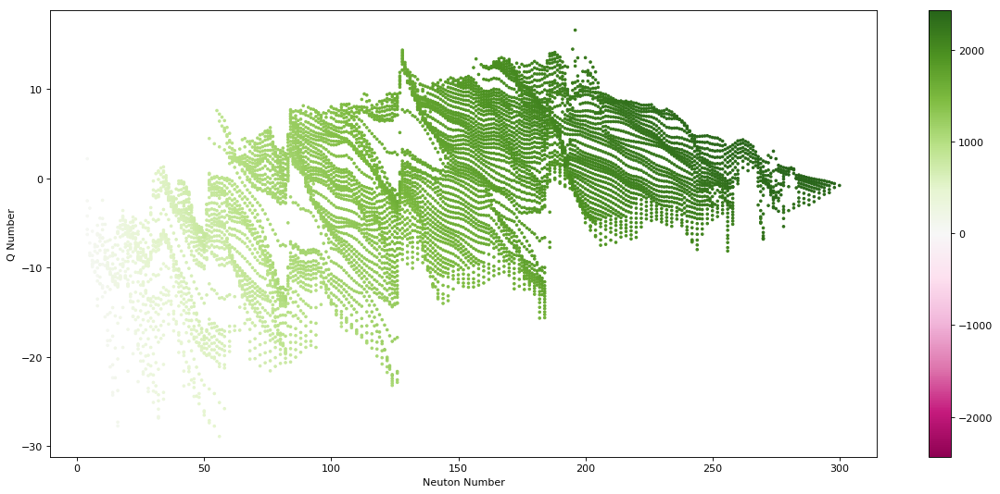

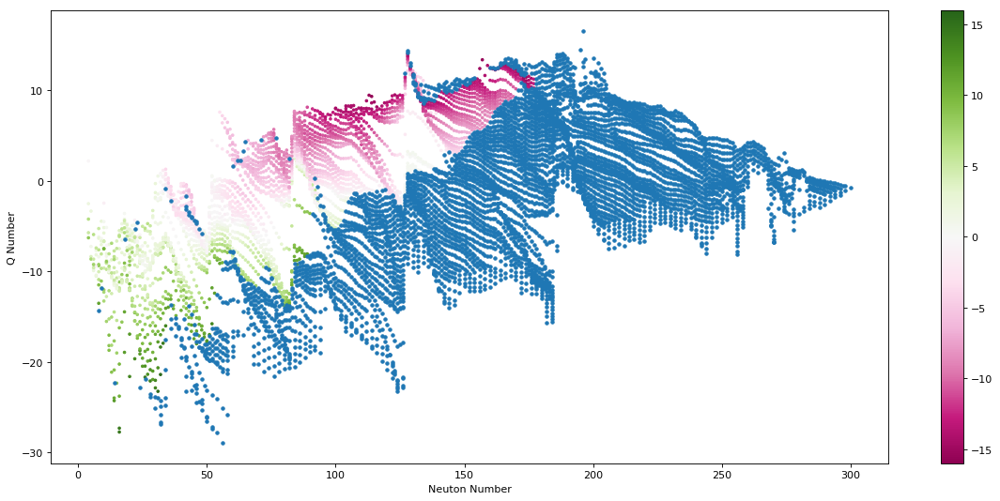

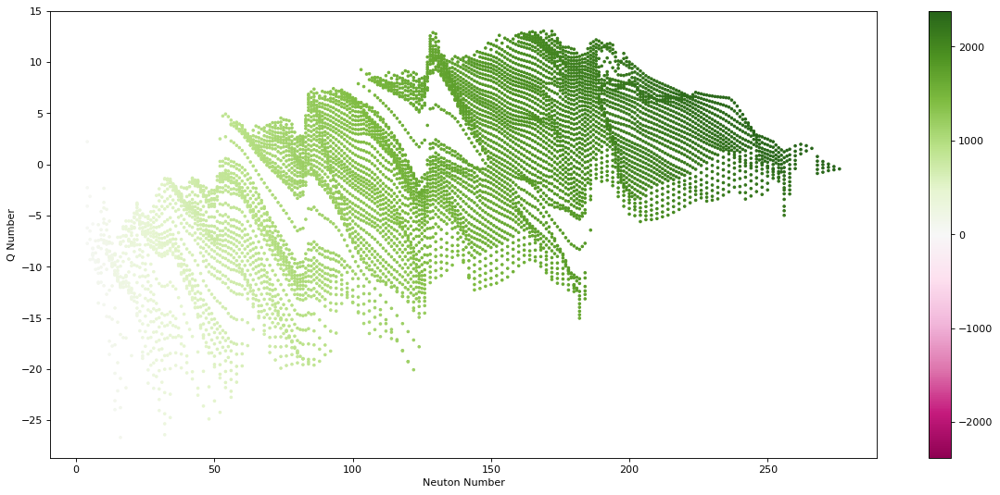

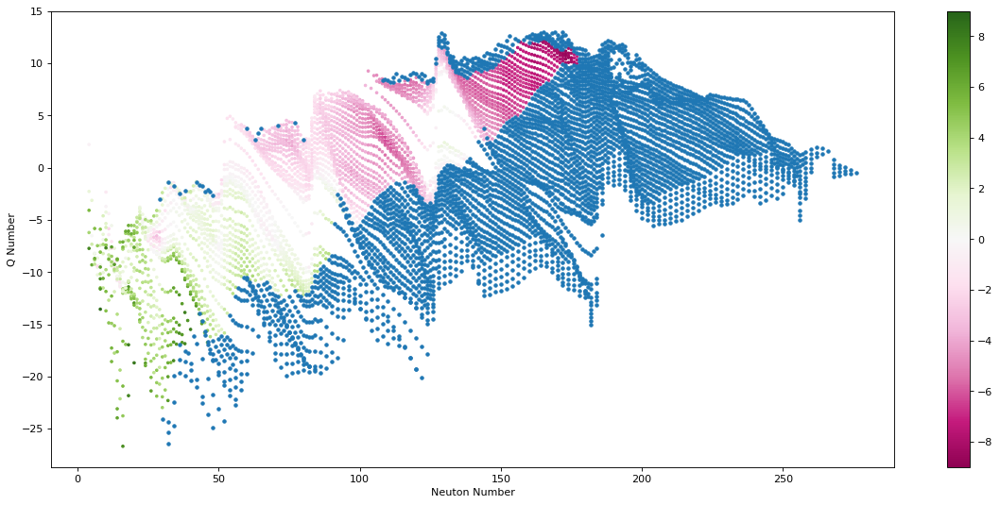

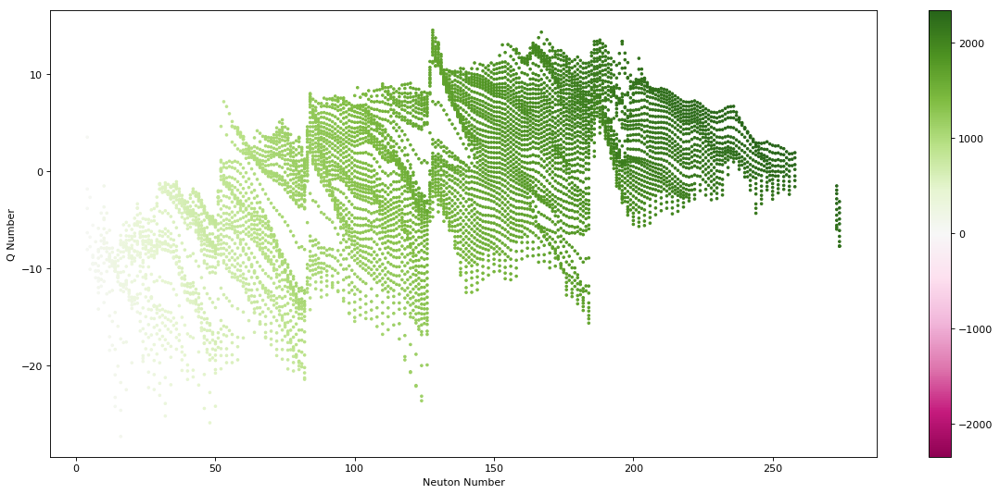

...

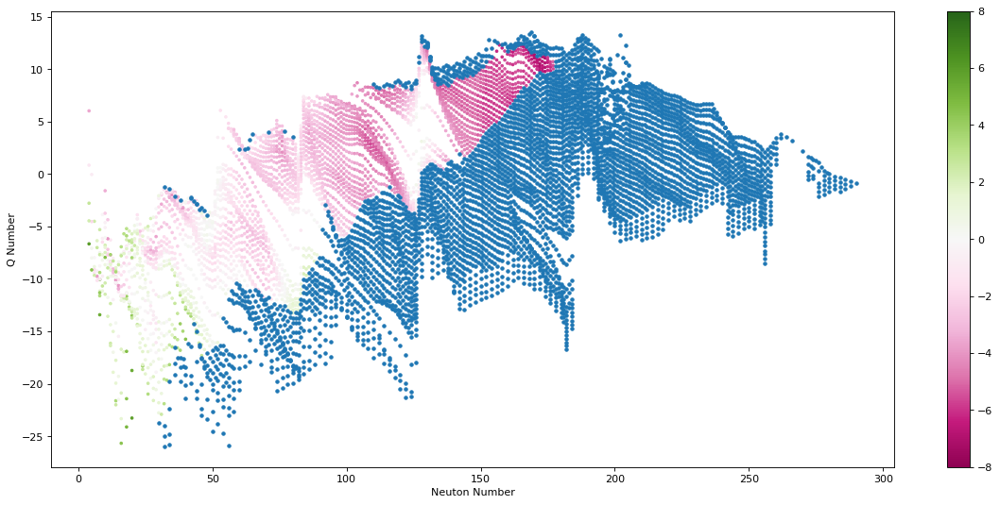

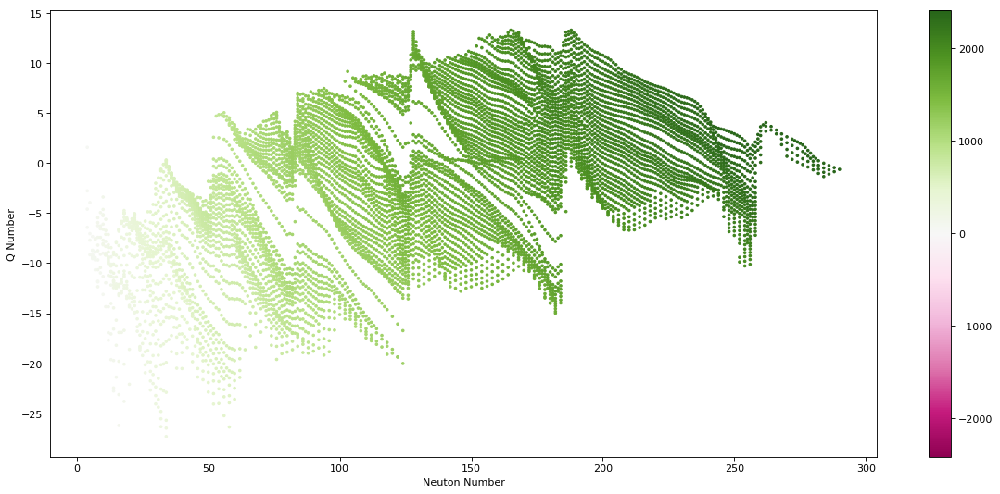

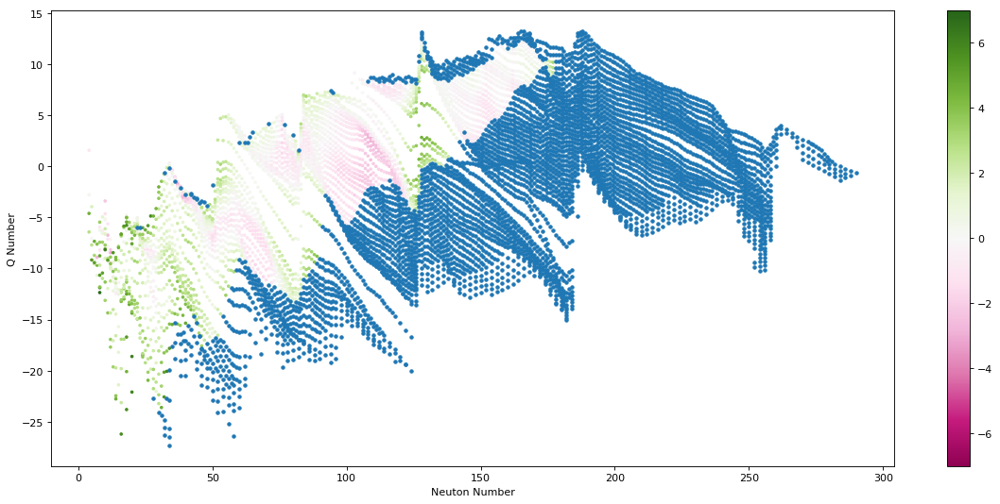

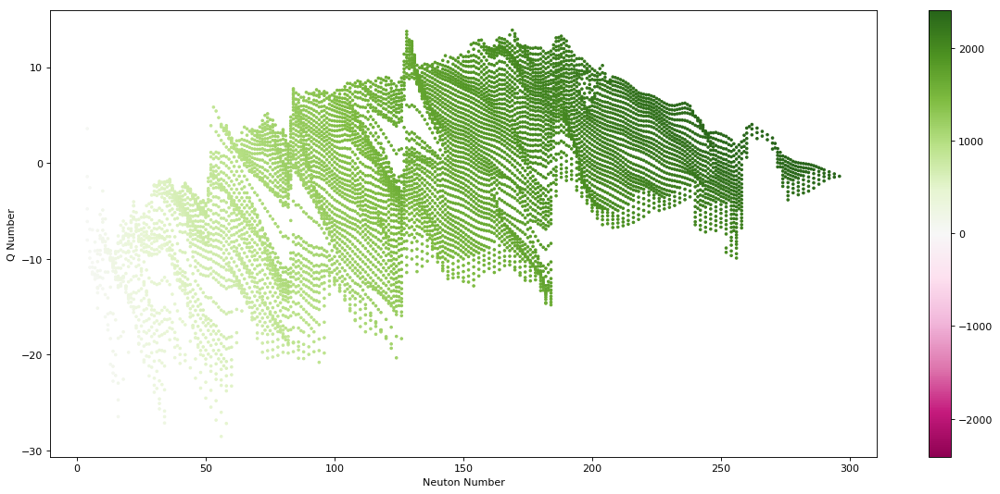

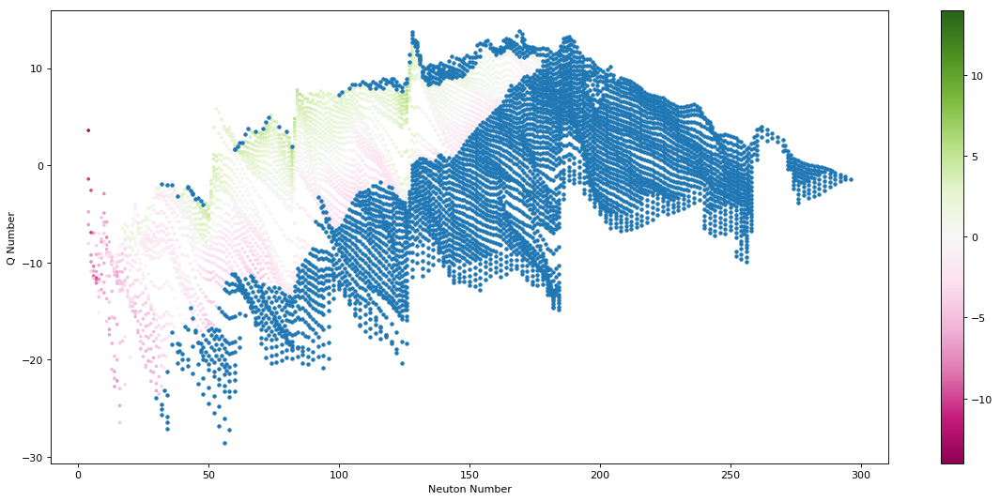

'\n\nfor i in range(0,6):\n    ax = plt.axes(projection=\'3d\')\n    ax.plot_trisurf(np.transpose(the_nonan_energies[i])[0], np.transpose(the_nonan_energies[i])[1], np.transpose(the_nonan_energies[i])[3], cmap=\'viridis\', edgecolor=\'none\');\n    ax.view_init(85,15)\n    plt.xlabel("proton #")\n    plt.ylabel("Neutron #")\n    \n    plt.show()\n    ax = plt.axes(projection=\'3d\')\n    ax.plot_trisurf(np.transpose(the_nonan_energies[i])[0], np.transpose(the_nonan_energies[i])[1], np.transpose(the_nonan_energies[i])[3], cmap=\'viridis\', edgecolor=\'none\');\n    ax.view_init(45,75)\n    plt.show()\n \n\n\n\nfor i in range(0,6):\n    ax = plt.axes(projection=\'3d\')\n    ax.plot_trisurf(np.transpose(the_exp_mat_nonan_energies[i])[0], np.transpose(the_exp_mat_nonan_energies[i])[1], np.transpose(the_exp_mat_nonan_energies[i])[4], cmap=\'viridis\', edgecolor=\'none\');\n    ax.view_init(85,15)\n    plt.show()\n    \n    ax = plt.axes(projection=\'3d\')\n    ax.plot_trisurf(np.transpose(t

In [9]:
#the_exp_mat_nonan_energies   
#the_no_mat_nonan_energies    
#the_nonan_energies           


#the_expmat_nonan_energies: 8
#0 Neutron,1 Proton,2 T_BE,3 E_BE,4 difference,5 Q,6 S_n,7 S_p

#the_nonan_energies: 6
#the_energies: Z,N,T_BE,Q,S_n,S_p


#the_nomat_nonan_energies: 6
# Z,N,T_BE,Q,S_n,S_p




#print(np.shape(the_exp_mat_nonan_energies[0]))
#print(np.shape(the_no_mat_nonan_energies[0]))
#print(np.shape(the_nonan_energies[0]))

for i in range(0,6):
    ext = np.int(np.ceil(max(-np.min(np.transpose(the_nonan_energies[i])[2]),np.max(np.transpose(the_nonan_energies[i])[2]))))
    fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc = plt.scatter(np.transpose(the_nonan_energies[i])[0],np.transpose(the_nonan_energies[i])[3],c=(np.transpose(the_nonan_energies[i])[2]),cmap='PiYG',vmin=-ext,vmax=ext,s=5)
    plt.xlabel('Neuton Number')
    plt.ylabel('Q Number')
    plt.colorbar(sc)
    plt.show()

    ext = np.int(np.ceil(max(-np.min(np.transpose(the_exp_mat_nonan_energies[i])[4]),np.max(np.transpose(the_exp_mat_nonan_energies[i])[4]))))
    fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc = plt.scatter(np.transpose(the_exp_mat_nonan_energies[i])[0],np.transpose(the_exp_mat_nonan_energies[i])[5],c=(np.transpose(the_exp_mat_nonan_energies[i])[4]),cmap='PiYG',vmin=-ext,vmax=ext,s=5)
    plt.xlabel('Neuton Number')
    plt.ylabel('Q Number')
    plt.colorbar(sc)
    plt.plot(np.transpose(the_no_mat_nonan_energies[i])[0],np.transpose(the_no_mat_nonan_energies[i])[3], "o", markersize=3)
    plt.show()



"""

for i in range(0,6):
    ax = plt.axes(projection='3d')
    ax.plot_trisurf(np.transpose(the_nonan_energies[i])[0], np.transpose(the_nonan_energies[i])[1], np.transpose(the_nonan_energies[i])[3], cmap='viridis', edgecolor='none');
    ax.view_init(85,15)
    plt.xlabel("proton #")
    plt.ylabel("Neutron #")
    
    plt.show()
    ax = plt.axes(projection='3d')
    ax.plot_trisurf(np.transpose(the_nonan_energies[i])[0], np.transpose(the_nonan_energies[i])[1], np.transpose(the_nonan_energies[i])[3], cmap='viridis', edgecolor='none');
    ax.view_init(45,75)
    plt.show()
 



for i in range(0,6):
    ax = plt.axes(projection='3d')
    ax.plot_trisurf(np.transpose(the_exp_mat_nonan_energies[i])[0], np.transpose(the_exp_mat_nonan_energies[i])[1], np.transpose(the_exp_mat_nonan_energies[i])[4], cmap='viridis', edgecolor='none');
    ax.view_init(85,15)
    plt.show()
    
    ax = plt.axes(projection='3d')
    ax.plot_trisurf(np.transpose(the_exp_mat_nonan_energies[i])[0], np.transpose(the_exp_mat_nonan_energies[i])[1], np.transpose(the_exp_mat_nonan_energies[i])[4], cmap='viridis', edgecolor='none');
    ax.view_init(35,75)
    plt.show()
"""

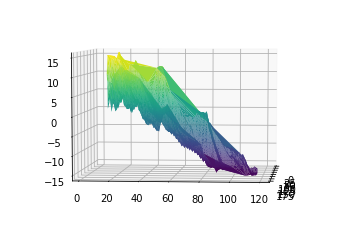

In [10]:
ax = plt.axes(projection='3d')
ax.plot_trisurf(np.transpose(the_exp_mat_nonan_energies[0])[0], np.transpose(the_exp_mat_nonan_energies[0])[1], np.transpose(the_exp_mat_nonan_energies[0])[4], cmap='viridis', edgecolor='none');
ax.view_init(5,5)


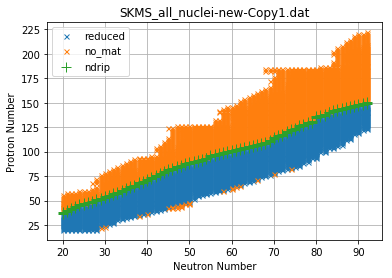

(8, 2919)
(6, 5430)
(8, 351)


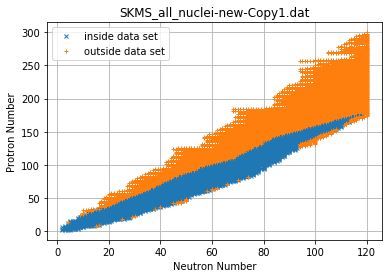

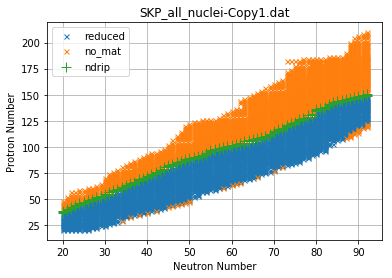

(8, 2939)
(6, 4188)
(8, 351)


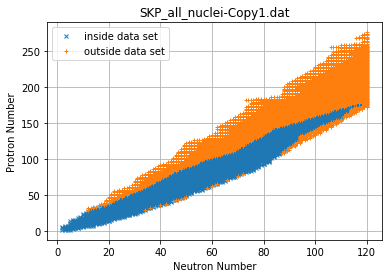

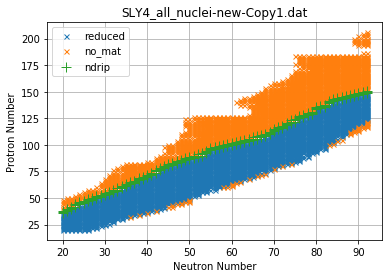

(8, 2927)
(6, 3986)
(8, 351)


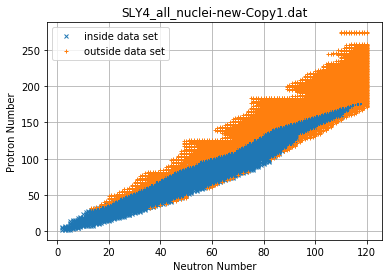

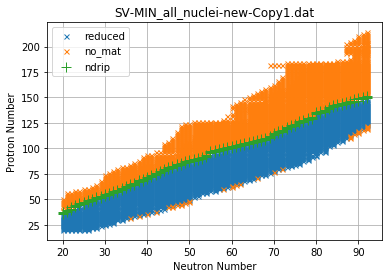

(8, 2941)
(6, 4632)
(8, 351)


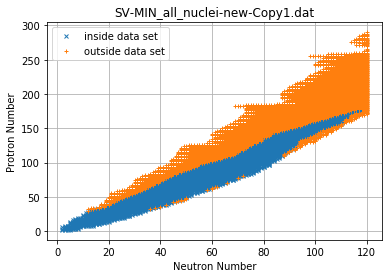

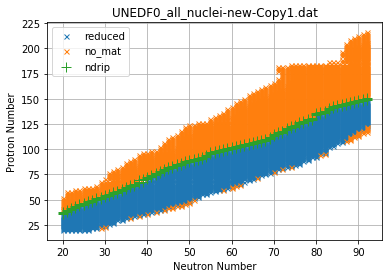

(8, 2939)
(6, 5010)
(8, 351)


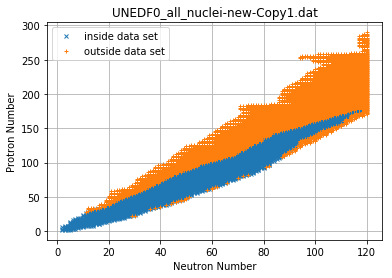

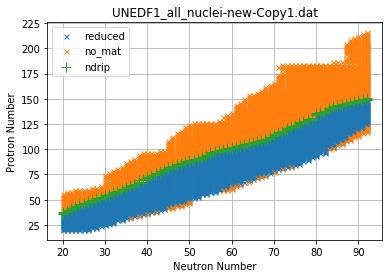

(8, 2949)
(6, 5024)
(8, 351)


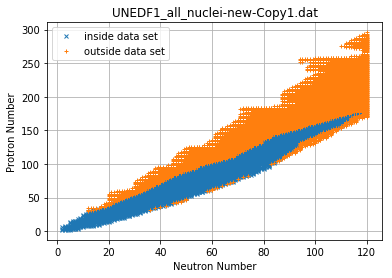

In [12]:
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#GRAPHS
#GRAPHS
#GRAPHS
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$



for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_range[i]=np.transpose(zdrip_range[i])
    ndrip_range[i]=np.transpose(ndrip_range[i])
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i]) 
    the_exp_mat_reduced_range[i]=np.transpose(the_exp_mat_reduced_range[i])    
    the_no_mat_range[i]=np.transpose(the_no_mat_range[i])
    
    the_range[i]=np.transpose(the_range[i])
    the_energies[i]=np.transpose(the_energies[i])
    
    
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    


for i in range(0,6):


    #plt.plot(the_exp_mat_range[i][0],the_exp_mat_range[i][1], "x", markersize=5, label='all')
    plt.plot(the_exp_mat_reduced_range[i][1],the_exp_mat_reduced_range[i][0], "x", markersize=5, label='reduced')
    plt.plot(the_no_mat_range[i][1],the_no_mat_range[i][0], "x", markersize=5, label='no_mat')
    #plt.plot(zdrip_range[i][0],zdrip_range[i][1], "+", markersize=10, label='zdrip')
    plt.plot(ndrip_range[i][1],ndrip_range[i][0], "+", markersize=10, label='ndrip')
    plt.title(the_names[i])
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.grid(True)
    plt.legend()
    plt.show()
    
    print(np.shape(the_exp_mat_reduced_energies[i]))
    print(np.shape(the_no_mat_energies[i]))
    print(np.shape(ndrip_energies[i]))
    
    #plt.plot(the_exp_mat_range[i][0],the_exp_mat_range[i][1], "x", markersize=5, label='all')
    plt.plot(the_exp_mat_energies[i][1],the_exp_mat_energies[i][0], "x", markersize=4, label='inside data set')
    plt.plot(the_no_mat_energies[i][1],the_no_mat_energies[i][0], "+", markersize=4, label='outside data set')
    #plt.plot(zdrip_energies[i][0],zdrip_energies[i][1], "+", markersize=10, label='zdrip')
    #plt.plot(ndrip_energies[i][0],ndrip_energies[i][1], "+", markersize=10, label='ndrip')
    plt.title(the_names[i])
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.grid(True)
    plt.legend()
    plt.show()
    
    
for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_range[i]=np.transpose(zdrip_range[i])    
    ndrip_range[i]=np.transpose(ndrip_range[i]) 
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i])
    the_exp_mat_reduced_range[i]=np.transpose(the_exp_mat_reduced_range[i])  
    the_no_mat_range[i]=np.transpose(the_no_mat_range[i])
    
    the_range[i]=np.transpose(the_range[i])
    the_energies[i]=np.transpose(the_energies[i])
    
    
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    

    

# Applying the random Forest


fuction objectives:

train an rf object

return the training and testing score
return the training and testing mean squared error

if there is an ndrip zone return the score and mean squared error of the ndrip zone

for all nuclei with theoretical values use the rf to predict difference add it to the value







In [29]:
name=["SKMS",
      "SKP",
      "SLY4",
      "SV-MIN",
      "UNEDF0",
      "UNEDF1"]

# Neutron, Proton, Theoretical BE, Experimental BE, difference, Q
#   0,        1,       2,               3,               4,      5   

             #  1          2    3   4               5             6         7                 8               9           10                   11                 12  
def ml_predict(features, target,NZ, ndrip_features, ndrip_target, ndrip_NZ, all_the_features, all_the_values, all_the_NZ, body_ndrip_features, body_ndrip_targets, body_ndrip_NZ):
    """
    print("features:         ", np.shape(features))
    print("target:           ", np.shape(target))
    print("ndrip_features:   ", np.shape(ndrip_features))
    print("ndrip_target:     ", np.shape(ndrip_target))
    print("all_the_features: ", np.shape(all_the_features))
    print("all_the_values:   ", np.shape(all_the_values))
    """
    
    

    rf_object=RandomForestRegressor(n_estimators=1000)#, bootstrap=False,)
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size =0.25, random_state=42 )
    
 
    rf_object.fit(X_train,y_train)
    
    
    
    
    
    train_predictions         =  rf_object.predict(X_train)
    test_predictions          =  rf_object.predict(X_test)
    body_predictions          =  rf_object.predict(features)
    ndrip_predictions         =  rf_object.predict(ndrip_features)
    body_ndrip_predictions    =  rf_object.predict(body_ndrip_features)
    all_the_predictions       =  rf_object.predict(all_the_features)
    
    
    #body_ndrip_ml_error       =  body_ndrip_predictions-body_ndrip_targets
    
    
    
    
    print(    rf_object.score(X_train,y_train))
    print(    rf_object.score(X_test,y_test))
    print(    rf_object.score(features,target))
    print(   rf_object.score(ndrip_features, ndrip_target), "\n")
    
    print( np.sqrt(mean_squared_error(train_predictions,y_train)))
    print( np.sqrt(mean_squared_error(test_predictions,y_test)))
    print( np.sqrt(mean_squared_error(body_predictions,target)))
    print( np.sqrt(mean_squared_error(ndrip_predictions,ndrip_target)), "\n\n\n")
    
    """
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    ext = np.int(np.ceil(max(-np.min(body_ndrip_predictions),np.max(body_ndrip_predictions))))
    fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc = plt.scatter(np.transpose(body_ndrip_NZ)[0],np.transpose(body_ndrip_NZ)[1],c=body_ndrip_predictions,cmap='PiYG',vmin=-ext,vmax=ext,s=5)
    plt.title('predictions')
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.colorbar(sc)
    plt.show()
    
    ext = np.int(np.ceil(max(-np.min(body_ndrip_ml_error),np.max(body_ndrip_ml_error))))
    fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc = plt.scatter(np.transpose(body_ndrip_NZ)[0],np.transpose(body_ndrip_NZ)[1],c=body_ndrip_ml_error,cmap='PiYG',vmin=-ext,vmax=ext,s=5)
    plt.title('predictions-target')
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.colorbar(sc)
    plt.show()
    
    
    ext = np.int(np.ceil(max(-np.min(all_the_predictions),np.max(all_the_predictions))))
    fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc = plt.scatter(np.transpose(all_the_NZ)[0],np.transpose(all_the_NZ)[1],c=all_the_predictions,cmap='PiYG',vmin=-ext,vmax=ext,s=5)
    plt.title('all ml predictions of exp the difference')
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.colorbar(sc)
    plt.show()
    
    """
    
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    
    
    
    
    return all_the_predictions     #improved_values


    

def t_be_improve(features, target,NZ, ndrip_features, ndrip_target, ndrip_NZ, all_the_features, all_the_values, all_the_NZ, body_ndrip_features, body_ndrip_targets, body_ndrip_NZ):
    
    ml_comp=ml_predict(features, target,NZ, ndrip_features, ndrip_target, ndrip_NZ, all_the_features, all_the_values, all_the_NZ, body_ndrip_features, body_ndrip_targets, body_ndrip_NZ)
    """
    ext = np.int(np.ceil(max(-np.min(ml_comp+all_the_values),np.max(ml_comp+all_the_values))))
    fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc = plt.scatter(np.transpose(all_the_NZ)[0],np.transpose(all_the_NZ)[1],c=ml_comp+all_the_values,cmap='PiYG',vmin=-ext,vmax=ext,s=5)
    plt.plot(np.transpose(body_ndrip_NZ)[0],np.transpose(body_ndrip_NZ)[1], 'x', markersize=2)
    plt.title('all ml predictions of exp the difference')
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.colorbar(sc)
    plt.show()
    """
    #sub=[]
    #for j in range(0,len(ml_comp)):
    #        sub.append(all_the_values[j]-ml_comp[j])
    
    all_the_values=all_the_values-ml_comp
    
    return all_the_values

    
  


     
 

rf_ZQ_SKMS
1.1185486115349674
2.9746234774005136
1646.3731704157656
(2442,)


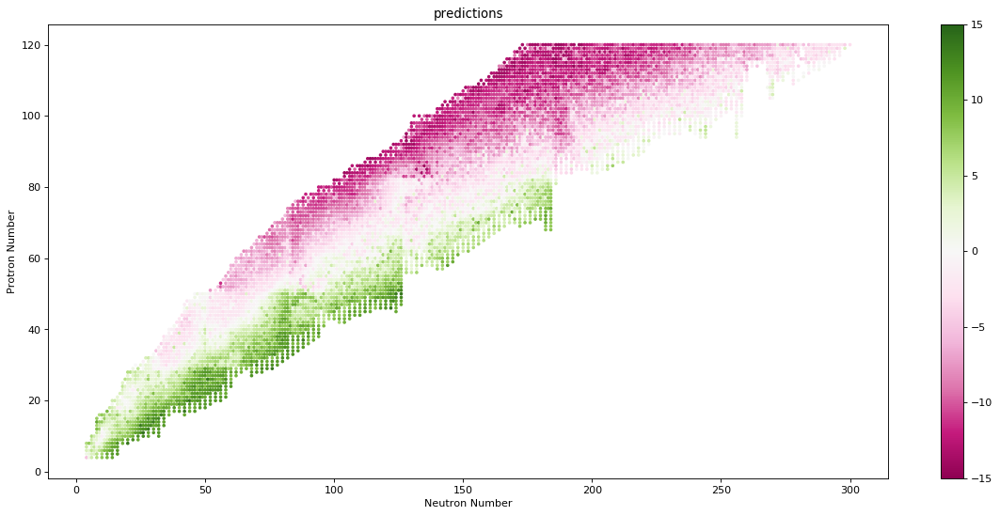

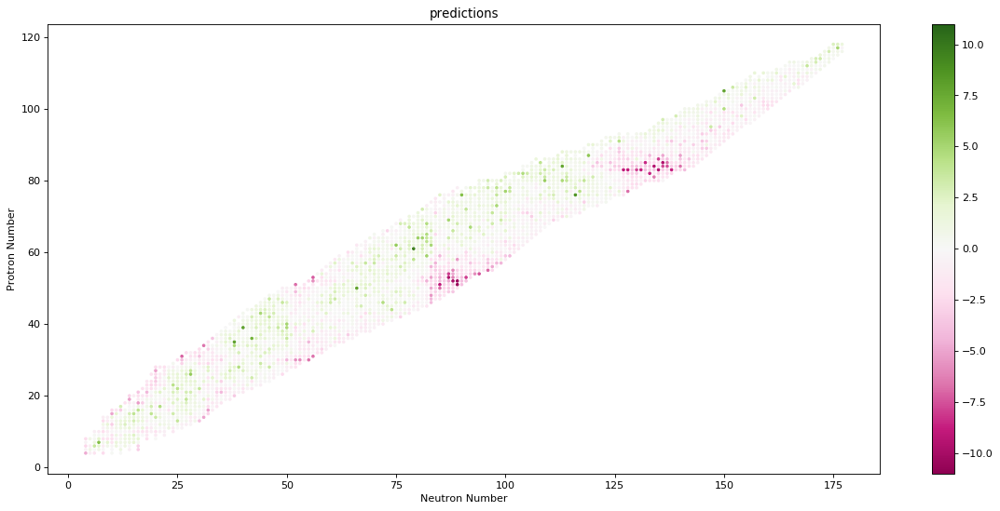

rf_ZQ_SKP
0.7095126890043141
1.963373888637996
1597.610362450836
(2457,)


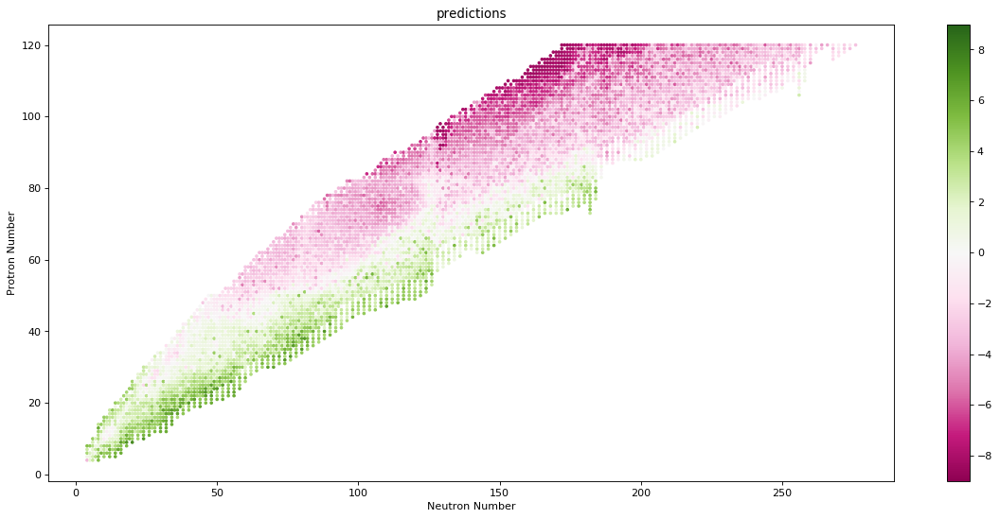

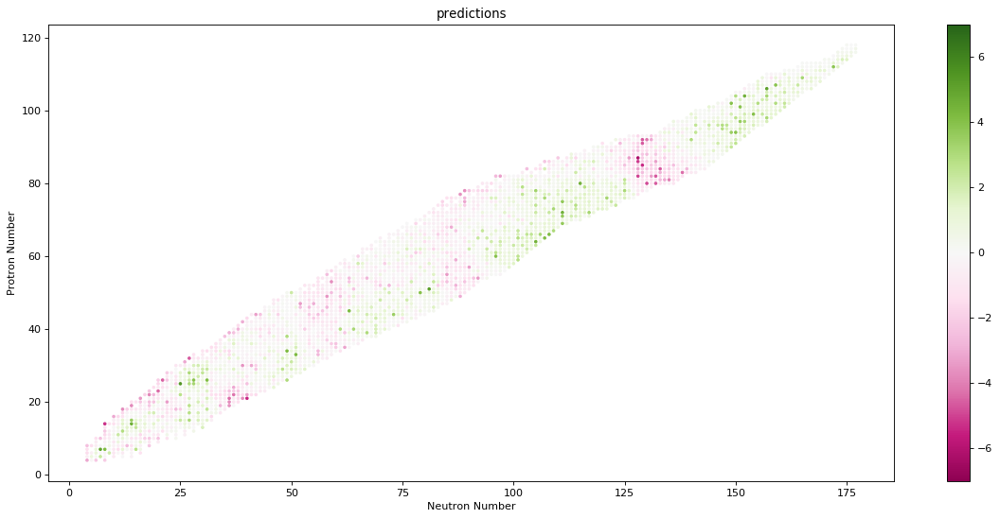

rf_ZQ_SLY4
1.3054938636681437
3.604063780850928
1590.3227092838904
(2449,)


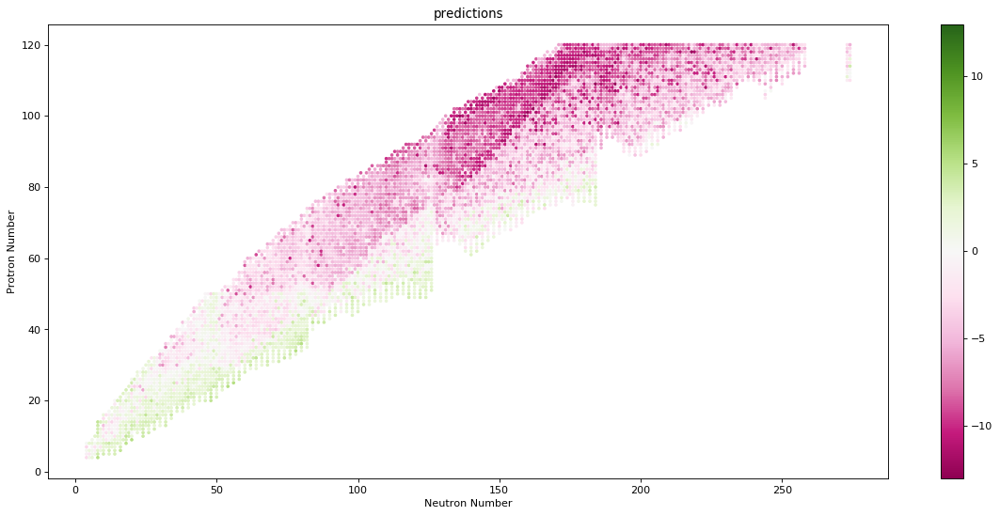

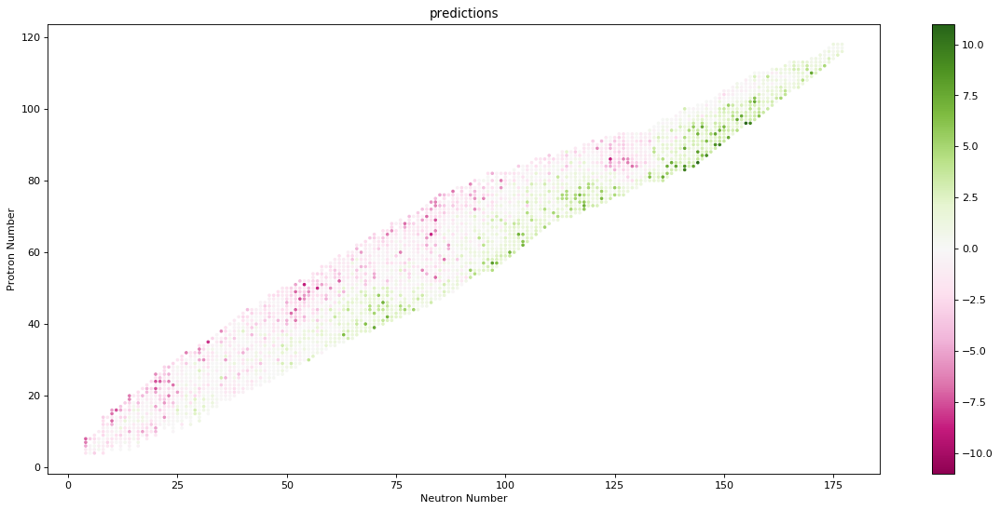

rf_ZQ_SV-MIN
0.5637913993334052
1.5345420025890286
1616.330462626519
(2459,)


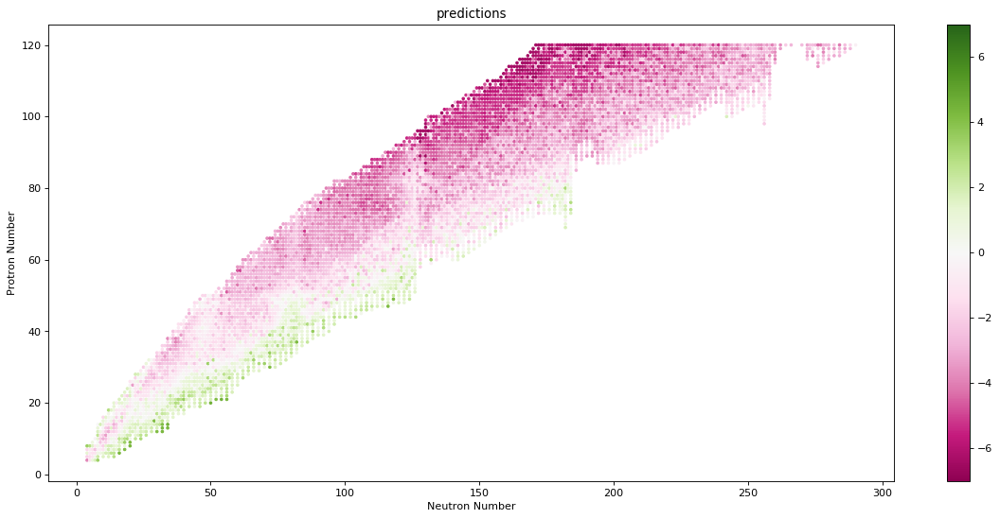

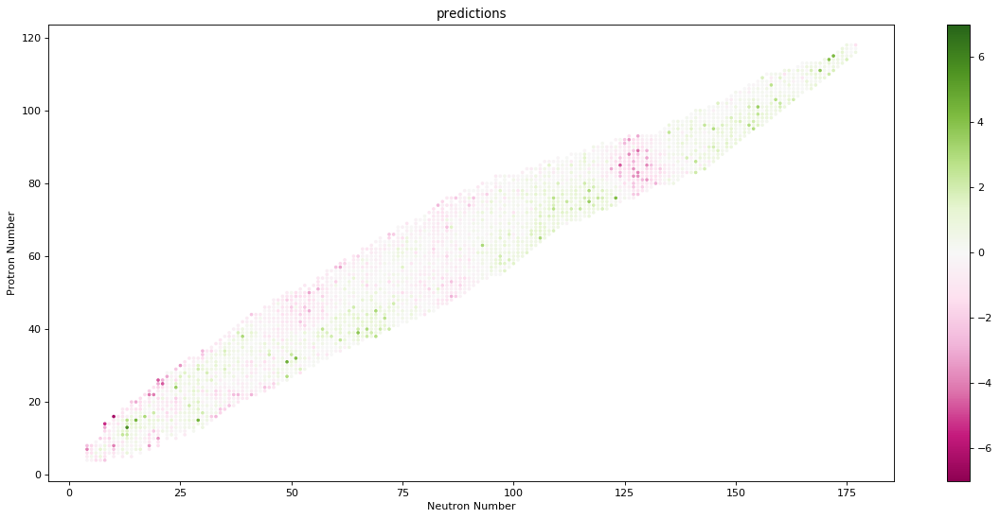

rf_ZQ_UNEDF0
0.5679510234626174
1.6474114499901291
1622.4572699038224
(2457,)


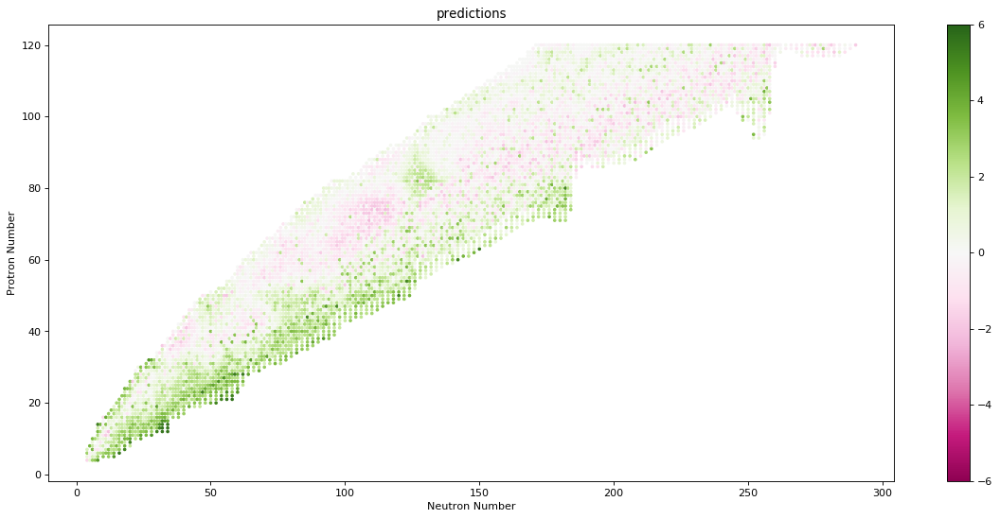

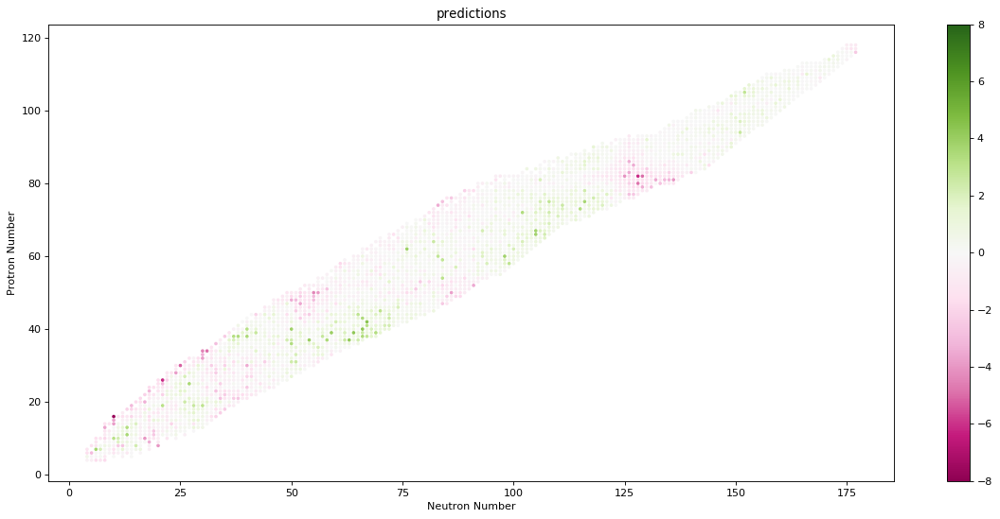

rf_ZQ_UNEDF1
0.7669051835214367
2.0095380467937063
1632.4435789057598
(2465,)


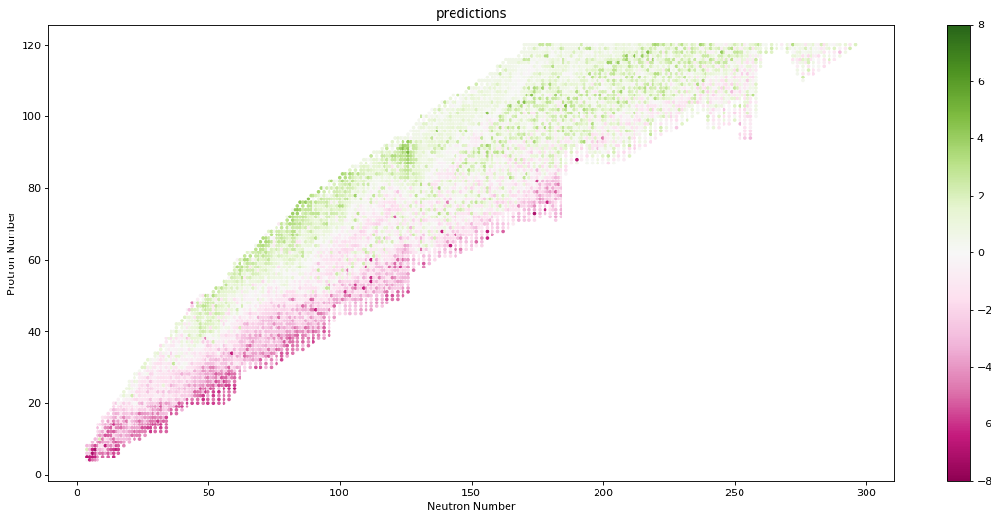

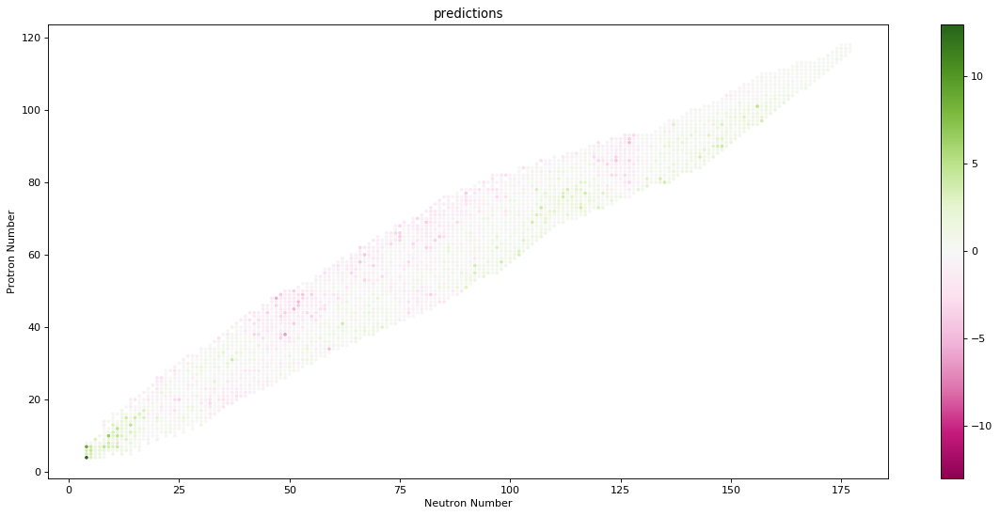

In [66]:
rf_ZQ_name=["rf_ZQ_SKMS",
         "rf_ZQ_SKP",
         "rf_ZQ_SLY4",
         "rf_ZQ_SV-MIN",
         "rf_ZQ_UNEDF0",
         "rf_ZQ_UNEDF1",]


for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_range[i]=np.transpose(zdrip_range[i])
    ndrip_range[i]=np.transpose(ndrip_range[i])
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i]) 
    the_exp_mat_reduced_range[i]=np.transpose(the_exp_mat_reduced_range[i])    
    the_no_mat_range[i]=np.transpose(the_no_mat_range[i])
    the_range[i]=np.transpose(the_range[i])
    the_energies[i]=np.transpose(the_energies[i])
    
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    
    zdrip_nonan_energies[i]=np.transpose(zdrip_nonan_energies[i])              
    ndrip_nonan_energies[i]=np.transpose(ndrip_nonan_energies[i])
    the_exp_mat_reduced_nonan_energies[i]=np.transpose(the_exp_mat_reduced_nonan_energies[i])
    the_exp_mat_nonan_energies[i]=np.transpose(the_exp_mat_nonan_energies[i])
    the_no_mat_nonan_energies[i]=np.transpose(the_no_mat_nonan_energies[i])
    the_nonan_energies[i]=np.transpose(the_nonan_energies[i])
    
    
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++

BE_T           =[[],[],[], [],[],[]]
BE_T_d         =[{},{},{}, {},{},{}]

BE_T_ml        =[[],[],[], [],[],[]]
BE_T_ml_d      =[{},{},{}, {},{},{}]
the_NZ         =[[],[],[], [],[],[]]
ml_comp        =[[],[],[], [],[],[]]
ml_comp_d      =[{},{},{}, {},{},{}]

rf_object=RandomForestRegressor(n_estimators=1000)#, bootstrap=False,)
    
for i in range(0,6):
    
    print(rf_ZQ_name[i])
    train_test_features=the_exp_mat_nonan_energies[i][5]#np.transpose(np.stack((the_exp_mat_nonan_energies[i][1],the_exp_mat_nonan_energies[i][0])))
    train_test_NZ      =np.transpose(np.stack((the_exp_mat_nonan_energies[i][0],the_exp_mat_nonan_energies[i][1])))
    train_test_target  =the_exp_mat_nonan_energies[i][4]
    
    the_features=the_nonan_energies[i][3]
   
    the_NZ[i]          =np.transpose(np.stack((the_nonan_energies[i][0],the_nonan_energies[i][1])))
    the_BE             =the_nonan_energies[i][2]
    BE_T[i]            =the_nonan_energies[i][2] 
    
    
    
    train_test_features=pd.DataFrame(train_test_features)
    the_features=pd.DataFrame(the_features)
    
    
    the_features=pd.DataFrame(the_features)
    
    X_train, X_test, y_train, y_test = train_test_split(train_test_features, train_test_target, test_size =0.25, random_state=42 )
    
 
    rf_object.fit(X_train,y_train)
    
    train_score         =  rf_object.score(X_train,y_train)
    test_score          =  rf_object.score(X_test,y_test)
    
    
    tr_pred=rf_object.predict(X_train)
    te_pred=rf_object.predict(X_test)
    body_pred=rf_object.predict(train_test_features)
    the_pred=rf_object.predict(the_features)
    
    body_pred=body_pred.tolist()
    tr_pred=tr_pred.tolist()
    te_pred=te_pred.tolist()
    the_pred=the_pred.tolist()
    
    BE_T_ml[i]=the_BE-the_pred
    ml_comp[i]=the_pred

    print(np.sqrt(mean_squared_error(tr_pred,y_train)))
    print(np.sqrt(mean_squared_error(te_pred,y_test)))
    print(np.sqrt(mean_squared_error(the_pred,the_BE)))
    print(np.shape(tr_pred))
    
    ext = np.int(np.ceil(max(-np.min(the_pred),np.max(the_pred))))
    fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc = plt.scatter(np.transpose(the_NZ[i])[0],np.transpose(the_NZ[i])[1],c=the_pred,cmap='PiYG',vmin=-ext,vmax=ext,s=5)
    plt.title('predictions')
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.colorbar(sc)
    plt.show()
    
    ext = np.int(np.ceil(max(-np.min(body_pred-train_test_target),np.max(body_pred-train_test_target))))
    fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc = plt.scatter(np.transpose(train_test_NZ)[0],np.transpose(train_test_NZ)[1],c=body_pred-train_test_target,cmap='PiYG',vmin=-ext,vmax=ext,s=5)
    plt.title('predictions')
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.colorbar(sc)
    plt.show()
    
    
    
    
    for j in range(0,len(the_NZ[i])):
        BE_T_ml_d[i][the_NZ[i][j][0],the_NZ[i][j][1]]=BE_T_ml[i][j]
        BE_T_d[i][the_NZ[i][j][0],the_NZ[i][j][1]]=BE_T[i][j]
        ml_comp_d[i][the_NZ[i][j][0],the_NZ[i][j][1]]=ml_comp[i][j]
    
    
    

    

    
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_range[i]=np.transpose(zdrip_range[i])
    ndrip_range[i]=np.transpose(ndrip_range[i])
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i]) 
    the_exp_mat_reduced_range[i]=np.transpose(the_exp_mat_reduced_range[i])    
    the_no_mat_range[i]=np.transpose(the_no_mat_range[i])
    the_range[i]=np.transpose(the_range[i])
    the_energies[i]=np.transpose(the_energies[i])
    
     
    
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    
    
    zdrip_nonan_energies[i]=np.transpose(zdrip_nonan_energies[i])              
    ndrip_nonan_energies[i]=np.transpose(ndrip_nonan_energies[i])
    the_exp_mat_reduced_nonan_energies[i]=np.transpose(the_exp_mat_reduced_nonan_energies[i])
    the_exp_mat_nonan_energies[i]=np.transpose(the_exp_mat_nonan_energies[i])
    the_no_mat_nonan_energies[i]=np.transpose(the_no_mat_nonan_energies[i])
    the_nonan_energies[i]=np.transpose(the_nonan_energies[i])
    
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    

In [14]:
for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_range[i]=np.transpose(zdrip_range[i])
    ndrip_range[i]=np.transpose(ndrip_range[i])
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i]) 
    the_exp_mat_reduced_range[i]=np.transpose(the_exp_mat_reduced_range[i])    
    the_no_mat_range[i]=np.transpose(the_no_mat_range[i])
    the_range[i]=np.transpose(the_range[i])
    the_energies[i]=np.transpose(the_energies[i])
    
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    
    zdrip_nonan_energies[i]=np.transpose(zdrip_nonan_energies[i])              
    ndrip_nonan_energies[i]=np.transpose(ndrip_nonan_energies[i])
    the_exp_mat_reduced_nonan_energies[i]=np.transpose(the_exp_mat_reduced_nonan_energies[i])
    the_exp_mat_nonan_energies[i]=np.transpose(the_exp_mat_nonan_energies[i])
    the_no_mat_nonan_energies[i]=np.transpose(the_no_mat_nonan_energies[i])
    the_nonan_energies[i]=np.transpose(the_nonan_energies[i])
    
    
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++

BE_T           =[[],[],[], [],[],[]]
BE_T_d         =[{},{},{}, {},{},{}]

BE_T_ml        =[[],[],[], [],[],[]]
BE_T_ml_d      =[{},{},{}, {},{},{}]
the_NZ         =[[],[],[], [],[],[]]
ml_comp        =[[],[],[], [],[],[]]
ml_comp_d      =[{},{},{}, {},{},{}]

pred_in_out    =[[],[],[], [],[],[]]
pred_in_out_d  =[{},{},{}, {},{},{}]

rf_object=RandomForestRegressor(n_estimators=10)#, bootstrap=False,)
    
for i in range(0,6):
    # Neutron, Proton, T_BE, E_BE, difference, Q, S_n, S_p
       #   0     1       2     3     4
    train_test_features=np.transpose(np.stack((the_exp_mat_nonan_energies[i][1],the_exp_mat_nonan_energies[i][5])))
    train_test_NZ      =np.transpose(np.stack((the_exp_mat_nonan_energies[i][1],the_exp_mat_nonan_energies[i][0])))
    #diff, T_BE, E_BE
    train_test_target  =np.transpose(np.stack((the_exp_mat_nonan_energies[i][4],the_exp_mat_nonan_energies[i][2],the_exp_mat_nonan_energies[i][3])))
    
    body_ndrip_features=np.transpose(np.stack((the_exp_mat_nonan_energies[i][1],the_exp_mat_nonan_energies[i][5])))
    body_ndrip_NZ      =np.transpose(np.stack((the_exp_mat_nonan_energies[i][0],the_exp_mat_nonan_energies[i][1])))
    body_ndrip_target  =the_exp_mat_nonan_energies[i][4]
    
    ndrip_features     =np.transpose(np.stack((ndrip_nonan_energies[i][1],ndrip_nonan_energies[i][5])))
    ndrip_NZ           =np.transpose(np.stack((ndrip_nonan_energies[i][0],ndrip_nonan_energies[i][1])))
    ndrip_target       =ndrip_nonan_energies[i][4]
    
    features           =np.transpose(np.stack((the_nonan_energies[i][1],the_nonan_energies[i][3])))
    the_NZ[i]          =np.transpose(np.stack((the_nonan_energies[i][0],the_nonan_energies[i][1])))
    the_BE             =the_nonan_energies[i][2]
    BE_T[i]            =the_nonan_energies[i][2] 
    
    
    print(np.shape(train_test_features))
    print(np.shape(train_test_target))
    
    X_train, X_test, y_train, y_test = train_test_split(train_test_features, train_test_target, test_size =0.25, random_state=42 )
    rf_object.fit(X_train,np.transpose(y_train)[0])
    
    pred_tr         =rf_object.predict(X_train)
    pred_te         =rf_object.predict(X_test)
    pred_in         =rf_object.predict(train_test_features)
    pred_in_out[i]  =rf_object.predict(features)
    
    
    mse_train     =np.sqrt(mean_squared_error(np.transpose(y_train)[1],np.transpose(y_train)[2]))
    mse_test     =np.sqrt(mean_squared_error(np.transpose(y_test)[1],np.transpose(y_test)[2]))
    mse_in       =np.sqrt(mean_squared_error(np.transpose(train_test_target)[1],np.transpose(train_test_target)[2]))
    
    mse_train_ml=np.sqrt(mean_squared_error(np.transpose(y_train)[1]-pred_tr,np.transpose(y_train)[2]))
    mse_test_ml =np.sqrt(mean_squared_error(np.transpose(y_test)[1]-pred_te,np.transpose(y_test)[2]))
    mse_in_ml   =np.sqrt(mean_squared_error(np.transpose(train_test_target)[1]-pred_in,np.transpose(train_test_target)[2]))
    
    
    imp_train   =abs(mse_train-mse_train_ml)/mse_train
    imp_test     =abs(mse_test-mse_test_ml)/mse_test
    imp_in      =abs(mse_in-mse_in_ml)/mse_in
    
    print(name[i])
    print("score")
    print(rf_object.score(X_train,np.transpose(y_train)[0]))
    print(rf_object.score(X_test,np.transpose(y_test)[0]))
    print(rf_object.score(train_test_features,np.transpose(train_test_target)[0]), "\n")
    
    print("the exp mean square error")   
    print("train: ", mse_train   )
    print("test:  ", mse_test    )
    print("in:    ", mse_in      )
    print("the_ml exp mean square error")
    
    print("train: ", mse_train_ml)
    print("test:  ", mse_test_ml )
    print("in:    ", mse_in_ml   )
    
    print(" mean square error improvement")
    
    print("train: ", imp_train   )
    print("test:  ", imp_test    )
    print("in:    ", imp_in      )
    
    
    
    
    
    #print("ml diff mean square error")
    #print(np.sqrt(mean_squared_error(pred_tr,np.transpose(y_train)[0])))
    #print(np.sqrt(mean_squared_error(pred_te,np.transpose(y_test)[0])))
    #print(np.sqrt(mean_squared_error(pred_in,np.transpose(train_test_target)[0])), "\n\n\n")
    
    
    
    
    the_BE_ml=the_BE-pred_in_out[i]
    
    BE_T_ml[i]=the_BE_ml
    
    
    for j in range(0,len(the_NZ[i])):
        BE_T_ml_d[i][the_NZ[i][j][0],the_NZ[i][j][1]]=BE_T_ml[i][j]
        BE_T_d[i][the_NZ[i][j][0],the_NZ[i][j][1]]=BE_T[i][j]
        pred_in_out_d[i][the_NZ[i][j][0],the_NZ[i][j][1]]=pred_in_out[i][j]
       
    

    

    
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_range[i]=np.transpose(zdrip_range[i])
    ndrip_range[i]=np.transpose(ndrip_range[i])
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i]) 
    the_exp_mat_reduced_range[i]=np.transpose(the_exp_mat_reduced_range[i])    
    the_no_mat_range[i]=np.transpose(the_no_mat_range[i])
    the_range[i]=np.transpose(the_range[i])
    the_energies[i]=np.transpose(the_energies[i])
    
     
    
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    
    
    zdrip_nonan_energies[i]=np.transpose(zdrip_nonan_energies[i])              
    ndrip_nonan_energies[i]=np.transpose(ndrip_nonan_energies[i])
    the_exp_mat_reduced_nonan_energies[i]=np.transpose(the_exp_mat_reduced_nonan_energies[i])
    the_exp_mat_nonan_energies[i]=np.transpose(the_exp_mat_nonan_energies[i])
    the_no_mat_nonan_energies[i]=np.transpose(the_no_mat_nonan_energies[i])
    the_nonan_energies[i]=np.transpose(the_nonan_energies[i])
    
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    

(3257, 2)
(3257, 3)
SKMS
score
0.9809817670007434
0.8814763365343491
0.9554253417822048 

the exp mean square error
train:  7.270693839506878
test:   7.177887000947325
in:     7.247582241742476
the_ml exp mean square error
train:  0.9097548224077356
test:   2.314505488644534
in:     1.4003632615829753
 mean square error improvement
train:  0.8748737269798946
test:   0.6775505816211553
in:     0.806782011590351
(3277, 2)
(3277, 3)
SKP
score
0.9809751836608662
0.894829599506419
0.9577222601389545 

the exp mean square error
train:  3.655100154870276
test:   3.728428377493585
in:     3.673586301150318
the_ml exp mean square error
train:  0.45705069338100457
test:   1.1323548145514664
in:     0.6909949420765817
 mean square error improvement
train:  0.8749553571679828
test:   0.6962916543102041
in:     0.8119018078164629
(3266, 2)
(3266, 3)
SLY4
score
0.9766001441447042
0.8822056793169691
0.9511367839935586 

the exp mean square error
train:  5.546094464941566
test:   5.4570392191089505
in

In [24]:
for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_range[i]=np.transpose(zdrip_range[i])
    ndrip_range[i]=np.transpose(ndrip_range[i])
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i]) 
    the_exp_mat_reduced_range[i]=np.transpose(the_exp_mat_reduced_range[i])    
    the_no_mat_range[i]=np.transpose(the_no_mat_range[i])
    the_range[i]=np.transpose(the_range[i])
    the_energies[i]=np.transpose(the_energies[i])
    
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    
    zdrip_nonan_energies[i]=np.transpose(zdrip_nonan_energies[i])              
    ndrip_nonan_energies[i]=np.transpose(ndrip_nonan_energies[i])
    the_exp_mat_reduced_nonan_energies[i]=np.transpose(the_exp_mat_reduced_nonan_energies[i])
    the_exp_mat_nonan_energies[i]=np.transpose(the_exp_mat_nonan_energies[i])
    the_no_mat_nonan_energies[i]=np.transpose(the_no_mat_nonan_energies[i])
    the_nonan_energies[i]=np.transpose(the_nonan_energies[i])
    
    
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    
rf_object=RandomForestRegressor(n_estimators=1000)#, bootstrap=False,)
    
    
    # Neutron, Proton, T_BE, E_BE, difference, Q, S_n, S_p
       #   0     1       2     3     4
train_test_features=np.transpose(np.stack((the_exp_mat_nonan_energies[0][1],the_exp_mat_nonan_energies[0][0])))
train_test_NZ      =np.transpose(np.stack((the_exp_mat_nonan_energies[0][1],the_exp_mat_nonan_energies[0][0])))
    #diff, T_BE, E_BE
train_test_target  =np.transpose(np.stack((the_exp_mat_nonan_energies[0][4],the_exp_mat_nonan_energies[0][2],the_exp_mat_nonan_energies[0][3])))

body_ndrip_features=np.transpose(np.stack((the_exp_mat_nonan_energies[0][1],the_exp_mat_nonan_energies[0][0])))
body_ndrip_NZ      =np.transpose(np.stack((the_exp_mat_nonan_energies[0][0],the_exp_mat_nonan_energies[0][1])))
body_ndrip_target  =the_exp_mat_nonan_energies[i][4]
    
ndrip_features     =np.transpose(np.stack((ndrip_nonan_energies[0][1],ndrip_nonan_energies[0][0])))
ndrip_NZ           =np.transpose(np.stack((ndrip_nonan_energies[0][0],ndrip_nonan_energies[0][1])))
ndrip_target       =ndrip_nonan_energies[i][4]
    
features           =np.transpose(np.stack((the_nonan_energies[0][1],the_nonan_energies[0][0])))
the_NZ[i]          =np.transpose(np.stack((the_nonan_energies[0][0],the_nonan_energies[0][1])))
the_BE             =the_nonan_energies[0][2]
BE_T[i]            =the_nonan_energies[0][2] 
    
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
mse_train=[]
mse_test =[]
mse_in   =[]

mse_train_ml=[]
mse_test_ml =[]
mse_in_ml   =[]

score_train=[]
score_test =[]
score_in   =[]

in_mean_per  =[]
in_std_per   =[]
in_ml_mean_per=[]
in_ml_std_per=[]
in_score_mean_per=[]
in_score_std_per=[]

s=0
for j in range(5, 96, 5):
    #in_ml_mean_per=[]
    #in_ml_std_per=[]
    
    mse_train_ml=[]
    mse_test_ml =[]
    mse_in_ml   =[]
    score_in=[]
    
    
    
    for k in range(0,10):
        print(k)
        
        X_train, X_test, y_train, y_test = train_test_split(train_test_features, train_test_target, test_size =j/100, random_state=42 )
        rf_object.fit(X_train,np.transpose(y_train)[0])

        pred_tr      =rf_object.predict(X_train)
        pred_te      =rf_object.predict(X_test)
        pred_in      =rf_object.predict(train_test_features)
        pred_in_out  =rf_object.predict(features)


        #mse_train[k].append(np.sqrt(mean_squared_error(np.transpose(y_train)[1],np.transpose(y_train)[2])))
        #mse_test[k].append(np.sqrt(mean_squared_error(np.transpose(y_test)[1],np.transpose(y_test)[2])))
        #mse_in[k].append(np.sqrt(mean_squared_error(np.transpose(train_test_target)[1],np.transpose(train_test_target)[2])))
        
        """
        print("y_train: ", np.shape(y_train))
        print(y_train[0])
        print(np.transpose(y_train)[1])
        print("y_test: ", np.shape(y_test))
        print("train_test_target: ", np.shape(train_test_target))
        
        print("pred_tr: ", np.shape(pred_tr)) 
        print(np.transpose(pred_tr)[0],"\n\n")
        
        print(k)
        print(len(np.transpose(y_train)[1]))
        print(len(np.transpose(y_train)[2]))
        print(len(pred_tr))
        
        print(np.transpose(y_train)[1])
        print(np.transpose(y_train)[2])
        print(pred_tr)
        """
        #first   =np.transpose(y_train)[1]-pred_tr
        #second  =np.transpose(y_train)[2]
        #ans=np.sqrt(mean_squared_error(first,second))
        
        mse_train_ml.append(np.sqrt(mean_squared_error(np.transpose(y_train)[1]-pred_tr,np.transpose(y_train)[2])))
        mse_test_ml.append(np.sqrt(mean_squared_error(np.transpose(y_test)[1]-pred_te,np.transpose(y_test)[2])))
        mse_in_ml.append(np.sqrt(mean_squared_error(np.transpose(train_test_target)[1]-pred_in,np.transpose(train_test_target)[2])))
        
        score_train.append(rf_object.score(X_train,np.transpose(y_train)[0]))
        score_test.append(rf_object.score(X_train,np.transpose(y_train)[0]))
        score_in.append(rf_object.score(X_train,np.transpose(y_train)[0]))
        
        
       
    
    print(j/10)
    in_score_std_per.append(np.std((score_in[0],
                                     score_in[1],
                                     score_in[2],
                                     score_in[3],
                                     score_in[4],
                                     score_in[5],
                                     score_in[6],
                                     score_in[7],
                                     score_in[8],
                                     score_in[9])))
    
    in_score_mean_per.append(np.mean((score_in[0],
                                     score_in[1],
                                     score_in[2],
                                     score_in[3],
                                     score_in[4],
                                     score_in[5],
                                     score_in[6],
                                     score_in[7],
                                     score_in[8],
                                     score_in[9])))


    in_ml_mean_per.append(np.mean((mse_in_ml[0],
                                     mse_in_ml[1],
                                     mse_in_ml[2],
                                     mse_in_ml[3],
                                     mse_in_ml[4],
                                     mse_in_ml[5],
                                     mse_in_ml[6],
                                     mse_in_ml[7],
                                     mse_in_ml[8],
                                     mse_in_ml[9])))

    in_ml_std_per.append(np.std((mse_in_ml[0],
                                     mse_in_ml[1],
                                     mse_in_ml[2],
                                     mse_in_ml[3],
                                     mse_in_ml[4],
                                     mse_in_ml[5],
                                     mse_in_ml[6],
                                     mse_in_ml[7],
                                     mse_in_ml[8],
                                     mse_in_ml[9])))



    
    print("the exp mean square error")   
    #print("train: ", mse_train   )
    #print("test:  ", mse_test    )
    #print("in:    ", in_mean_per[s]      )
    print("the_ml exp mean square error")
    #print("train: ", mse_train_ml)
    #print("test:  ", mse_test_ml )
    
    print("mean mean square rooot error of whole inside data set:    ", in_ml_mean_per[s])
    print("std mean square rooot error of whole inside data set:     ", in_ml_std_per[s])
    print("mean score of whole inside data set:    ", in_score_mean_per[s])
    print("std score  of whole inside data set:     ", in_score_std_per[s])
    
    
    s=s+1




    
   


#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_range[i]=np.transpose(zdrip_range[i])
    ndrip_range[i]=np.transpose(ndrip_range[i])
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i]) 
    the_exp_mat_reduced_range[i]=np.transpose(the_exp_mat_reduced_range[i])    
    the_no_mat_range[i]=np.transpose(the_no_mat_range[i])
    the_range[i]=np.transpose(the_range[i])
    the_energies[i]=np.transpose(the_energies[i])
    
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    
    zdrip_nonan_energies[i]=np.transpose(zdrip_nonan_energies[i])              
    ndrip_nonan_energies[i]=np.transpose(ndrip_nonan_energies[i])
    the_exp_mat_reduced_nonan_energies[i]=np.transpose(the_exp_mat_reduced_nonan_energies[i])
    the_exp_mat_nonan_energies[i]=np.transpose(the_exp_mat_nonan_energies[i])
    the_no_mat_nonan_energies[i]=np.transpose(the_no_mat_nonan_energies[i])
    the_nonan_energies[i]=np.transpose(the_nonan_energies[i])
    
    
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
   

0
1


KeyboardInterrupt: 

In [54]:
x=range(5, 96, 5)
plt.errorbar(x,in_ml_mean_per, yerr=in_ml_std_per, label="Mean Square Error")
plt.show()
plt.plot(x,in_ml_std_per)
plt.show()

plt.errorbar(x,in_score_mean_per, yerr=in_score_std_per)
plt.show()
plt.plot(x,in_score_std_per)
plt.show()


NameError: name 'in_ml_mean_per' is not defined

In [48]:
Sn_the_ml   =[[],[],[],[],[],[]]
Sn_ml       =[[],[],[],[],[],[]]

Sn_the      =[[],[],[],[],[],[]]
Sn_exp      =[]

n_Sn_the_ml =[[],[],[],[],[],[]]
n_Sn_the    =[[],[],[],[],[],[]]
n_Sn_exp    =[]

          
    
El_z=50




for i in range(0,6):
    #print(len(BE_T_ml_d[i]))
    #print(len(BE_T_d[i]))
    for n in range(0,200):
        try:
            BE_T_ml_d[i][n, El_z]  
            #ml_comp_d[i][n, El_z]
            #Sn_ml[i].append(ml_comp_d[i][n, El_z])
            #print(n, BE_T_ml_d[i][n, El_z]  )
            pred_in_out_d[i][n,El_z]
            Sn_ml[i].append(pred_in_out_d[i][n,El_z])
            
            Sn_the_ml[i].append(BE_T_ml_d[i][n, El_z])  
            n_Sn_the_ml[i].append(n) 
            
        
        except KeyError:
            continue
            

for i in range(0,6):
    for n in range(0,200):
        try:
            the_energies_d[i][n, El_z][2]
            Sn_the[i].append(the_energies_d[i][n, El_z][2])
            n_Sn_the[i].append(n)
        
        except KeyError:
            continue
            
            

for n in range(0,200):
    try:
        exp_energies_d[n,El_z]
        Sn_exp.append(exp_energies_d[n,El_z])     
        n_Sn_exp.append(n)     
        
    except KeyError:
        continue


            
  
  
#for i in range(0,6):
#    plt.plot(n_Sn_the_ml[i], Sn_ml[i])#, "o", markersize=4)

#plt.show()
Sn_the_mean       =[]
Sn_the_ml_mean    =[]
Sn_the_std        =[]
Sn_the_ml_std     =[]
n_Sn_the_mean     =[]
n_Sn_the_std      =[]
n_Sn_the_ml_mean  =[]
n_Sn_the_ml_std   =[]


for i in range(0,len(Sn_the[0])):
    try:
        Sn_the_mean.append(np.mean((Sn_the[0][i],Sn_the[1][i],Sn_the[2][i],Sn_the[3][i],Sn_the[4][i],Sn_the[5][i])))
        Sn_the_std.append(np.std((Sn_the[0][i],Sn_the[1][i],Sn_the[2][i],Sn_the[3][i],Sn_the[4][i],Sn_the[5][i])))
        n_Sn_the_mean.append(i+n_Sn_the[0][0])
        
    except KeyError:
        continue
        
    except IndexError:
        continue


for i in range(0,len(Sn_the_ml[0])):
    try:
        Sn_the_ml_mean.append(np.mean((Sn_the_ml[0][i],Sn_the_ml[1][i],Sn_the_ml[2][i],Sn_the[3][i],Sn_the_ml[4][i],Sn_the_ml[5][i])))
        Sn_the_ml_std.append(np.std((Sn_the_ml[0][i],Sn_the_ml[1][i],Sn_the_ml[2][i],Sn_the[3][i],Sn_the_ml[4][i],Sn_the_ml[5][i])))
        n_Sn_the_ml_mean.append(i+n_Sn_the[0][0])
        
    except KeyError:
        continue
        
    except IndexError:
        continue

In [1]:
print("mean with ml", np.mean(Sn_the_ml_std))
print("mean without ml", np.mean(Sn_the_std))
for i in range(0,6):
    plt.plot(ZN_n_Sn_the_ml[i], ZN_Sn_ml[i], label=name[i]+" ZN ml component")#, "o", markersize=4)
    plt.plot(ZQ_n_Sn_the_ml[i], ZQ_Sn_ml[i], label=name[i]+" ZQ ml component")#, "o", markersize=4)
    #plt.plot(n_Sn_the_ml[i], Sn_ml[i], label=name[i]+" Q random forest component")#, "o", markersize=4)

plt.xlabel("Ni neutron number (N)", fontsize=20, fontweight='bold')
plt.ylabel("ML Component (MeV)", fontsize=20, fontweight='bold')
plt.title("ML Component vs. Ni N",fontsize=20, fontweight='bold')
plt.plot([89,89], [-10,13], label="Experimental data boundary")
plt.legend(prop={"size":16})
plt.savefig('Ni_ml_component.pdf', format='pdf', bbox_inches='tight', transparent=True)

NameError: name 'np' is not defined

In [38]:
#ZQ_n_Sn_the_ml  =[[],[],[],[],[],[]]
#ZQ_Sn_ml        =[[],[],[],[],[],[]]
#ZN_n_Sn_the_ml   =[[],[],[],[],[],[]]
#ZN_Sn_ml         =[[],[],[],[],[],[]]


for i in range(0,6):
    #ZN_Sn_ml[i]=Sn_ml[i]
    #ZN_n_Sn_the_ml[i]=n_Sn_the_ml[i]
    print(np.shape(ZQ_n_Sn_the_ml[i]))
    print(np.shape(ZQ_Sn_ml[i]))
    print(np.shape(ZN_n_Sn_the_ml[i]))
    print(np.shape(ZN_Sn_ml[i]))

(80,)
(80,)
(80,)
(80,)
(66,)
(66,)
(66,)
(66,)
(67,)
(67,)
(67,)
(67,)
(69,)
(69,)
(69,)
(69,)
(73,)
(73,)
(73,)
(73,)
(72,)
(72,)
(72,)
(72,)


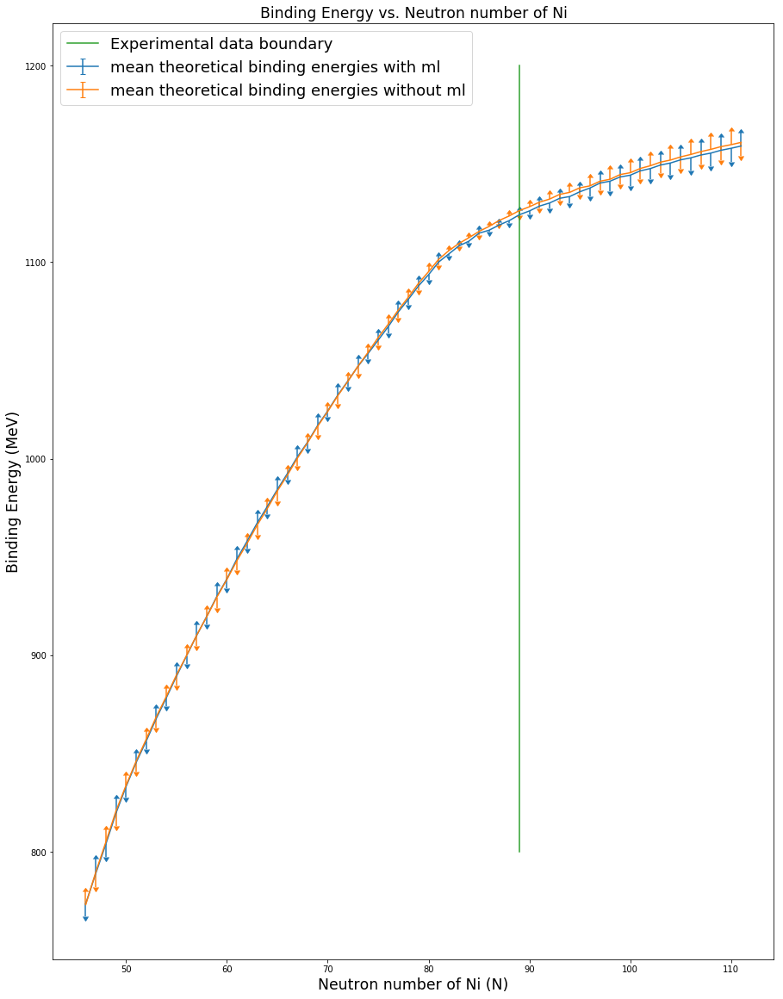

In [21]:
#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH
#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH
#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH


upperlimits = [True, False] * 33
lowerlimits = [False, True] * 33
plt.errorbar(n_Sn_the_ml_mean, Sn_the_ml_mean, yerr=Sn_the_ml_std, uplims=upperlimits, lolims=lowerlimits, label="mean theoretical binding energies with ml")#, "o", markersize=4)
upperlimits = [False, True] * 33
lowerlimits = [True,  False] * 33
plt.errorbar(n_Sn_the_mean, Sn_the_mean, yerr=Sn_the_ml_std, uplims=upperlimits, lolims=lowerlimits, label='mean theoretical binding energies without ml')
plt.plot([89,89], [800,1200], label="Experimental data boundary")
plt.title("Binding Energy vs. Neutron number of Ni", fontsize='xx-large')
plt.xlabel("Neutron number of Ni (N)", fontsize='xx-large')
plt.ylabel("Binding Energy (MeV)", fontsize='xx-large')
plt.legend(prop={"size":18})
plt.savefig('Ni_Binding_Energy.pdf', format='pdf', bbox_inches='tight', transparent=True)
 

#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH
#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH
#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH

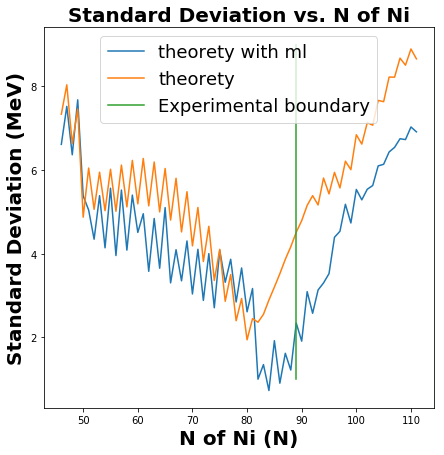

In [60]:



plt.plot(n_Sn_the_mean, Sn_the_ml_std, label="theorety with ml")
plt.plot(n_Sn_the_mean, Sn_the_std,  label="theorety")
plt.plot([89,89], [1,9], label="Experimental boundary")
plt.title("Standard Deviation vs. N of Ni", fontsize=20, fontweight='bold')
plt.xlabel("N of Ni (N)", fontsize=20, fontweight='bold')
plt.ylabel("Standard Deviation (MeV)", fontsize=20, fontweight='bold')
plt.legend(prop={"size":18})
plt.savefig('Ni Standard Deviation.pdf', format='pdf', bbox_inches='tight', transparent=True)
 


mean with ml 0.8336833649921969
mean without ml 0.6360812942592051


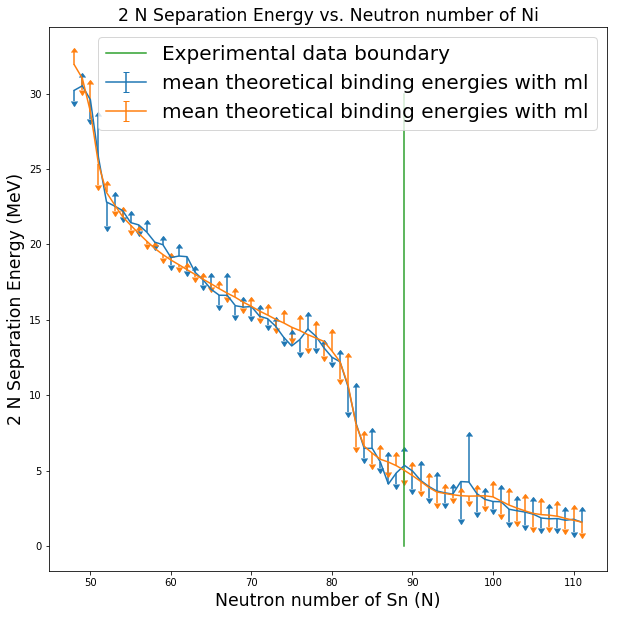

In [382]:
S_2n_all_the_ml=[[],[],[], [],[],[]]
S_2n_all_the_ml_d=[{},{},{},{},{},{}]


S_2n_exp=[]
n_S_2n_exp=[]
for n in range(0,200):
    try:
        exp_energies_d[n,El_z]
        exp_energies_d[n-2,El_z]
                

        S_2n_exp.append(exp_energies_d[n,El_z]-exp_energies_d[n-2,El_z])     
        n_S_2n_exp.append(n)     
        
    except KeyError:
        continue
        

for i in range(0,6):
    for n in range(2,400):
        for z in range(0,300):
            try:
                BE_T_ml_d[i][n, z] 
                BE_T_ml_d[i][n-2, z]
                
                S_2n_all_the_ml[i].append((n, z, BE_T_ml_d[i][n, z]-BE_T_ml_d[i][n-2, z], BE_T_d[i][n, z]-BE_T_d[i][n-2, z]))
                
                S_2n_all_the_ml_d[i][n,z]= (n, BE_T_ml_d[i][n, z]-BE_T_ml_d[i][n-2, z], BE_T_d[i][n, z]-BE_T_d[i][n-2, z])
            
            except KeyError:
                continue


El_S_2n_the_ml=[[],[],[],[],[],[]]
for i in range(0,6):
    for n in range(0,400):
        try:
            S_2n_all_the_ml_d[i][n,El_z]
            El_S_2n_the_ml[i].append(S_2n_all_the_ml_d[i][n,El_z])
             
        except KeyError:
            continue
            

"""
for i in range(0,len(Sn_the[0])):
    try:
        Sn_the_mean.append(np.mean((Sn_the[0][i],Sn_the[1][i],Sn_the[2][i],Sn_the[3][i],Sn_the[4][i],Sn_the[5][i])))
        Sn_the_std.append(np.std((Sn_the[0][i],Sn_the[1][i],Sn_the[2][i],Sn_the[3][i],Sn_the[4][i],Sn_the[5][i])))
        n_Sn_the_mean.append(i+n_Sn_the[0][0])
        
    except KeyError:
        continue
        
    except IndexError:
        continue
"""
n_El_S_2n_the_ml_mean  =[]
El_S_2n_the_ml_mean  =[]
El_S_2n_the_ml_std   =[]

for i in range(0,len(np.transpose(El_S_2n_the_ml[0])[1])):
    try:
        El_S_2n_the_ml_mean.append(np.mean((np.transpose(El_S_2n_the_ml[0])[1][i],
                                            np.transpose(El_S_2n_the_ml[1])[1][i],
                                            np.transpose(El_S_2n_the_ml[2])[1][i],
                                            np.transpose(El_S_2n_the_ml[3])[1][i],
                                            np.transpose(El_S_2n_the_ml[4])[1][i],
                                            np.transpose(El_S_2n_the_ml[5])[1][i])))
        
        n_El_S_2n_the_ml_mean.append(np.transpose(El_S_2n_the_ml[0])[0][i])

        
        El_S_2n_the_ml_std.append(np.std((np.transpose(El_S_2n_the_ml[0])[1][i],
                                            np.transpose(El_S_2n_the_ml[1])[1][i],
                                            np.transpose(El_S_2n_the_ml[2])[1][i],
                                            np.transpose(El_S_2n_the_ml[3])[1][i],
                                            np.transpose(El_S_2n_the_ml[4])[1][i],
                                            np.transpose(El_S_2n_the_ml[5])[1][i])))
        
    except KeyError:
        continue
    except IndexError:
        continue
        
     
n_El_S_2n_the_mean  =[]
El_S_2n_the_mean  =[]
El_S_2n_the_std   =[]

        
for i in range(0,len(np.transpose(El_S_2n_the_ml[0])[2])):
    try:
        El_S_2n_the_mean.append(np.mean((np.transpose(El_S_2n_the_ml[0])[2][i],
                                            np.transpose(El_S_2n_the_ml[1])[2][i],
                                            np.transpose(El_S_2n_the_ml[2])[2][i],
                                            np.transpose(El_S_2n_the_ml[3])[2][i],
                                            np.transpose(El_S_2n_the_ml[4])[2][i],
                                            np.transpose(El_S_2n_the_ml[5])[2][i])))
        
        n_El_S_2n_the_mean.append(np.transpose(El_S_2n_the_ml[0])[0][i])

        
        El_S_2n_the_std.append(np.std((np.transpose(El_S_2n_the_ml[0])[2][i],
                                            np.transpose(El_S_2n_the_ml[1])[2][i],
                                            np.transpose(El_S_2n_the_ml[2])[2][i],
                                            np.transpose(El_S_2n_the_ml[3])[2][i],
                                            np.transpose(El_S_2n_the_ml[4])[2][i],
                                            np.transpose(El_S_2n_the_ml[5])[2][i])))
        
    except KeyError:
        continue
    except IndexError:
        continue
    
"""
print("mean with ml", np.mean(Sn_the_ml_std))
print("mean without ml", np.mean(Sn_the_std))

upperlimits = [True, False] * 33
lowerlimits = [False, True] * 33

plt.errorbar(n_Sn_the_ml_mean, Sn_the_ml_mean, yerr=Sn_the_ml_std, uplims=upperlimits, lolims=lowerlimits, label="mean theoretical binding energies with ml")#, "o", markersize=4)
upperlimits = [False, True] * 33
lowerlimits = [True,  False] * 33
plt.errorbar(n_Sn_the_mean, Sn_the_mean, yerr=Sn_the_ml_std, uplims=upperlimits, lolims=lowerlimits, label='mean theoretical binding energies without ml')
"""
print("mean with ml", np.mean(El_S_2n_the_ml_std))
print("mean without ml", np.mean(El_S_2n_the_std))
#for i in range(0,6):
#    plt.plot(np.transpose(El_S_2n_the_ml[i])[0],np.transpose(El_S_2n_the_ml[i])[1], label=name[i]+' with ml')
#    plt.plot(np.transpose(El_S_2n_the_ml[i])[0],np.transpose(El_S_2n_the_ml[i])[2], label=name[i])


#plt.plot(n_El_S_2n_the_ml_mean,El_S_2n_the_ml_mean, "x", markersize=10, label="ml mean")   
#plt.plot(n_El_S_2n_the_mean,El_S_2n_the_mean, "+", markersize=10, label="no ml mean")   

#plt.plot(n_S_2n_exp,S_2n_exp, "o", markersize=10, label="Experimental")   


#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH
#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH
#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH

upperlimits = [True, False] * 32
lowerlimits = [False, True] * 32
plt.errorbar(n_El_S_2n_the_ml_mean, El_S_2n_the_ml_mean, yerr=El_S_2n_the_ml_std, uplims=upperlimits, lolims=lowerlimits, label="mean theoretical binding energies with ml")#, "o", markersize=4)
upperlimits = [False, True] * 32
lowerlimits = [True,  False] * 32
plt.errorbar(n_El_S_2n_the_mean, El_S_2n_the_mean, yerr=El_S_2n_the_std, uplims=upperlimits, lolims=lowerlimits, label="mean theoretical binding energies with ml")#, "o", markersize=4)
plt.plot([89,89], [0,30], label="Experimental data boundary")
plt.title("2 N Separation Energy vs. Neutron number of Ni", fontsize='xx-large')
plt.xlabel("Neutron number of Sn (N)", fontsize='xx-large' )
plt.ylabel("2 N Separation Energy (MeV)", fontsize='xx-large')
plt.legend(prop={"size":20})
plt.savefig('Ni_Separation_Energy.pdf', format='pdf', bbox_inches='tight', transparent=True)
 


#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH
#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH
#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH#GRAPH##GRAPH

    

21.48178954575244
3.225259710240739
1.1783691593426748
25.545819532543003
6.0513107833717354
4.858605532143551


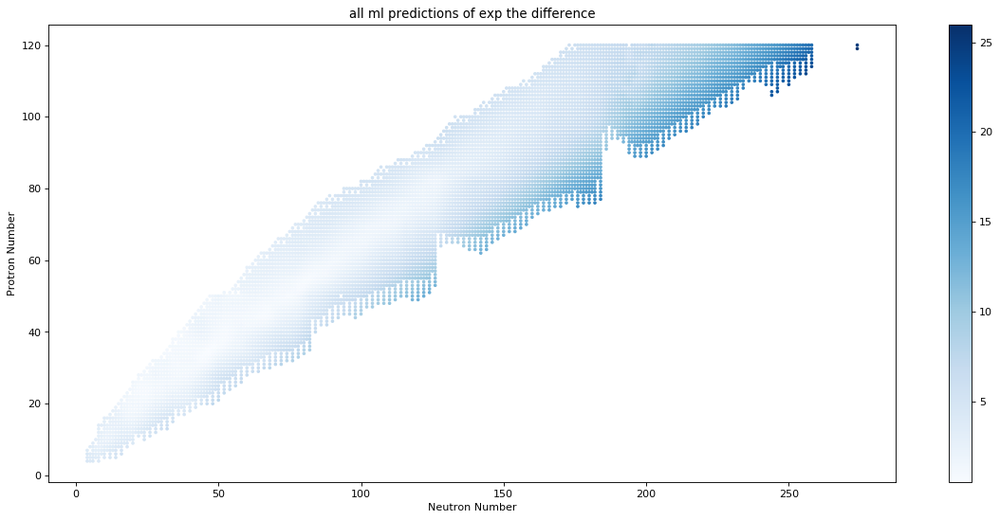

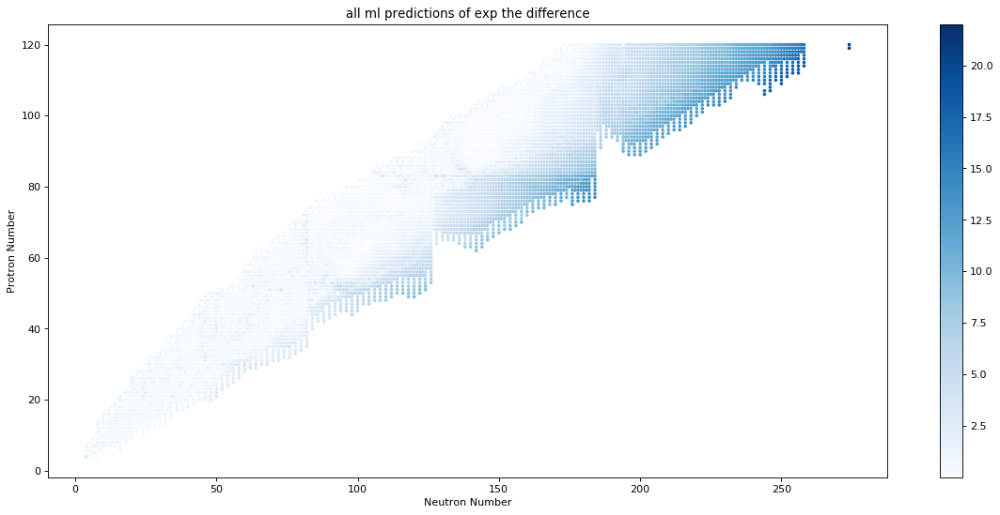

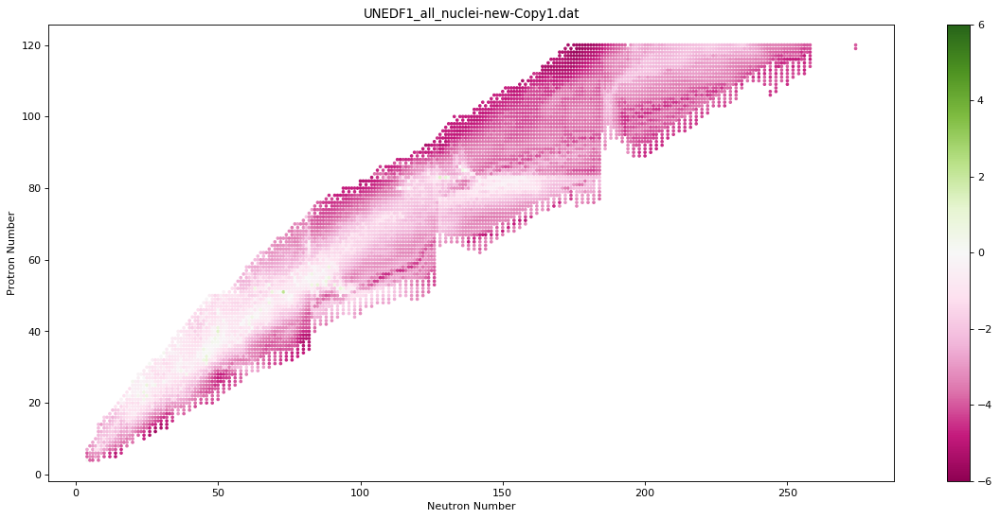

In [60]:
Be_T_all    =[]
Be_T_ml_all =[]

BE_std=[]
BE_ml_std=[]

for z in range(0,500):
    for n in range(0,500):
        try:
            BE_T_d[0][n, z]
            BE_T_d[1][n, z]
            BE_T_d[2][n, z]
            BE_T_d[3][n, z]
            BE_T_d[4][n, z]
            BE_T_d[5][n, z]
            
            #BE_Std=[BE_T_d[0][n, z],BE_T_d[2][n, z],BE_T_d[3][n, z],BE_T_d[4][n, z],BE_T_d[5][n, z]]
            
            BE_std.append((n,z,np.std((BE_T_d[0][n, z],BE_T_d[1][n, z],BE_T_d[2][n, z],BE_T_d[3][n, z],BE_T_d[5][n, z],BE_T_d[4][n, z]))))
            BE_ml_std.append((n,z,np.std((BE_T_ml_d[0][n, z],BE_T_ml_d[1][n, z],BE_T_ml_d[2][n, z],BE_T_ml_d[3][n, z],BE_T_ml_d[4][n, z],BE_T_ml_d[5][n, z]))))
            
            #Be_T_all.append((z,n,BE_T_d[0][n, z],BE_T_d[2][n, z],BE_T_d[3][n, z],BE_T_d[4][n, z],BE_T_d[5][n, z]))
            
        except KeyError:
            continue
            
print(max(np.transpose(BE_ml_std)[2]))
print(np.mean(np.transpose(BE_ml_std)[2]))
print(np.median(np.transpose(BE_ml_std)[2]))

print(max(np.transpose(BE_std)[2]))
print(np.mean(np.transpose(BE_std)[2]))
print(np.median(np.transpose(BE_std)[2]))

ext = np.int(np.ceil(max(np.transpose(BE_std)[2])))
fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
sc = plt.scatter(np.transpose(BE_std)[0],np.transpose(BE_std)[1],c=np.transpose(BE_std)[2],cmap='Blues',vmax=ext,s=5)
plt.title('all ml predictions of exp the difference')
plt.xlabel('Neutron Number')
plt.ylabel('Protron Number')
plt.colorbar(sc)
plt.show()
ext = np.int(np.ceil(max(np.transpose(BE_ml_std)[2])))
fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
sc = plt.scatter(np.transpose(BE_ml_std)[0],np.transpose(BE_ml_std)[1],c=np.transpose(BE_ml_std)[2],cmap='Blues',vmax=ext,s=5)
plt.title('all ml predictions of exp the difference')
plt.xlabel('Neutron Number')
plt.ylabel('Protron Number')
plt.colorbar(sc)
plt.show()

    

ext = np.int(np.ceil(max(-np.min(np.transpose(BE_ml_std)[2]-np.transpose(BE_std)[2]),np.max(np.transpose(BE_ml_std)[2]-np.transpose(BE_std)[2]))))
fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
sc = plt.scatter(np.transpose(BE_ml_std)[0],np.transpose(BE_ml_std)[1],c=np.transpose(BE_ml_std)[2]-np.transpose(BE_std)[2],cmap='PiYG',vmin=-ext,vmax=ext,s=5)
plt.title(the_names[i])
plt.xlabel('Neutron Number')
plt.ylabel('Protron Number')
plt.colorbar(sc)
plt.show()
      

In [84]:
rf_ZQ_name=["rf_ZQ_SKMS",
         "rf_ZQ_SKP",
         "rf_ZQ_SLY4",
         "rf_ZQ_SV-MIN",
         "rf_ZQ_UNEDF0",
         "rf_ZQ_UNEDF1",]


for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_range[i]=np.transpose(zdrip_range[i])
    ndrip_range[i]=np.transpose(ndrip_range[i])
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i]) 
    the_exp_mat_reduced_range[i]=np.transpose(the_exp_mat_reduced_range[i])    
    the_no_mat_range[i]=np.transpose(the_no_mat_range[i])
    the_range[i]=np.transpose(the_range[i])
    the_energies[i]=np.transpose(the_energies[i])
    
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    
    zdrip_nonan_energies[i]=np.transpose(zdrip_nonan_energies[i])              
    ndrip_nonan_energies[i]=np.transpose(ndrip_nonan_energies[i])
    the_exp_mat_reduced_nonan_energies[i]=np.transpose(the_exp_mat_reduced_nonan_energies[i])
    the_exp_mat_nonan_energies[i]=np.transpose(the_exp_mat_nonan_energies[i])
    the_no_mat_nonan_energies[i]=np.transpose(the_no_mat_nonan_energies[i])
    the_nonan_energies[i]=np.transpose(the_nonan_energies[i])
    
    
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++

BE_T           =[[],[],[], [],[],[]]
BE_T_d         =[{},{},{}, {},{},{}]

BE_T_ml        =[[],[],[], [],[],[]]
BE_T_ml_d      =[{},{},{}, {},{},{}]
the_NZ         =[[],[],[], [],[],[]]
ml_comp        =[[],[],[], [],[],[]]
ml_comp_d      =[{},{},{}, {},{},{}]

for i in range(0,6):
    
    print(rf_ZQ_name[i])
    train_test_features=np.transpose(np.stack((the_exp_mat_nonan_energies[i][1],the_exp_mat_nonan_energies[i][5])))
    train_test_NZ      =np.transpose(np.stack((the_exp_mat_nonan_energies[i][1],the_exp_mat_nonan_energies[i][0])))
    train_test_target  =the_exp_mat_nonan_energies[i][4]
    
    body_ndrip_features=np.transpose(np.stack((the_exp_mat_nonan_energies[i][1],the_exp_mat_nonan_energies[i][5])))
    body_ndrip_NZ      =np.transpose(np.stack((the_exp_mat_nonan_energies[i][0],the_exp_mat_nonan_energies[i][1])))
    body_ndrip_target  =the_exp_mat_nonan_energies[i][4]
    
    ndrip_features     =np.transpose(np.stack((ndrip_nonan_energies[i][1],ndrip_nonan_energies[i][5])))
    ndrip_NZ           =np.transpose(np.stack((ndrip_nonan_energies[i][0],ndrip_nonan_energies[i][1])))
    ndrip_target       =ndrip_nonan_energies[i][4]
    
    features           =np.transpose(np.stack((the_nonan_energies[i][1],the_nonan_energies[i][3])))
    the_NZ[i]          =np.transpose(np.stack((the_nonan_energies[i][0],the_nonan_energies[i][1])))
    the_BE             =the_nonan_energies[i][2]
    BE_T[i]            =the_nonan_energies[i][2] 
    
    
    BE_T_ml[i]=t_be_improve(train_test_features,
                          train_test_target,
                          train_test_NZ,
                          ndrip_features,
                          ndrip_target,
                          ndrip_NZ,
                          features,
                          the_BE,
                          the_NZ[i],
                          body_ndrip_features,
                          body_ndrip_target,
                          body_ndrip_NZ)
    
    """
    ml_comp[i]=ml_predict(train_test_features,
                          train_test_target,
                          train_test_NZ,
                           ndrip_features,
                          ndrip_target,
                          ndrip_NZ,
                          features,
                          the_BE,
                          the_NZ[i],
                          body_ndrip_features,
                         body_ndrip_target,
                          body_ndrip_NZ)
    """
    
    
    
    
    for j in range(0,len(the_NZ[i])):
        BE_T_ml_d[i][the_NZ[i][j][0],the_NZ[i][j][1]]=BE_T_ml[i][j]
        BE_T_d[i][the_NZ[i][j][0],the_NZ[i][j][1]]=BE_T[i][j]
       # ml_comp_d[i][the_NZ[i][j][0],the_NZ[i][j][1]]=ml_comp[i][j]
    
    
    

    

    
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_range[i]=np.transpose(zdrip_range[i])
    ndrip_range[i]=np.transpose(ndrip_range[i])
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i]) 
    the_exp_mat_reduced_range[i]=np.transpose(the_exp_mat_reduced_range[i])    
    the_no_mat_range[i]=np.transpose(the_no_mat_range[i])
    the_range[i]=np.transpose(the_range[i])
    the_energies[i]=np.transpose(the_energies[i])
    
     
    
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    
    
    zdrip_nonan_energies[i]=np.transpose(zdrip_nonan_energies[i])              
    ndrip_nonan_energies[i]=np.transpose(ndrip_nonan_energies[i])
    the_exp_mat_reduced_nonan_energies[i]=np.transpose(the_exp_mat_reduced_nonan_energies[i])
    the_exp_mat_nonan_energies[i]=np.transpose(the_exp_mat_nonan_energies[i])
    the_no_mat_nonan_energies[i]=np.transpose(the_no_mat_nonan_energies[i])
    the_nonan_energies[i]=np.transpose(the_nonan_energies[i])
    
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    


rf_ZQ_SKMS
0.9854724810753469
0.8894106911254813
0.960795702495983
0.9730727831320231 

0.7951242691449909
2.2356934458698636
1.313298764629782
1.3778939837922286 



rf_ZQ_SKP
0.9856760060316965
0.9034101032598845
0.9634667762536586
0.9837497121515345 

0.39658492377315635
1.0851795925276013
0.6423370690386913
0.6097088370113584 



rf_ZQ_SLY4
0.9828143350503038
0.8854648281228624
0.9565395252653512
0.9800740933395525 

0.5563010173602235
1.5153270777561767
0.8980319094152198
0.8496415700476455 



rf_ZQ_SV-MIN
0.9757457469408504
0.7687396186857033
0.9230928622117729
0.9629937746346668 

0.3337340207479009
1.042943137192434
0.5962724495355632
0.619828023632712 



rf_ZQ_UNEDF0
0.94574964574646
0.5960442381509172
0.8515230104277776
0.9124531934615072 

0.3444557804590277
0.9886710725729431
0.5775391912391925
0.5948856483605254 



rf_ZQ_UNEDF1
0.9660853511420695
0.7562116919040616
0.9131011920481783
0.9046432050354315 

0.41884470686807046
1.1321932437779603
0.6724007017244921
0.479151

0
1
2
3
4
5


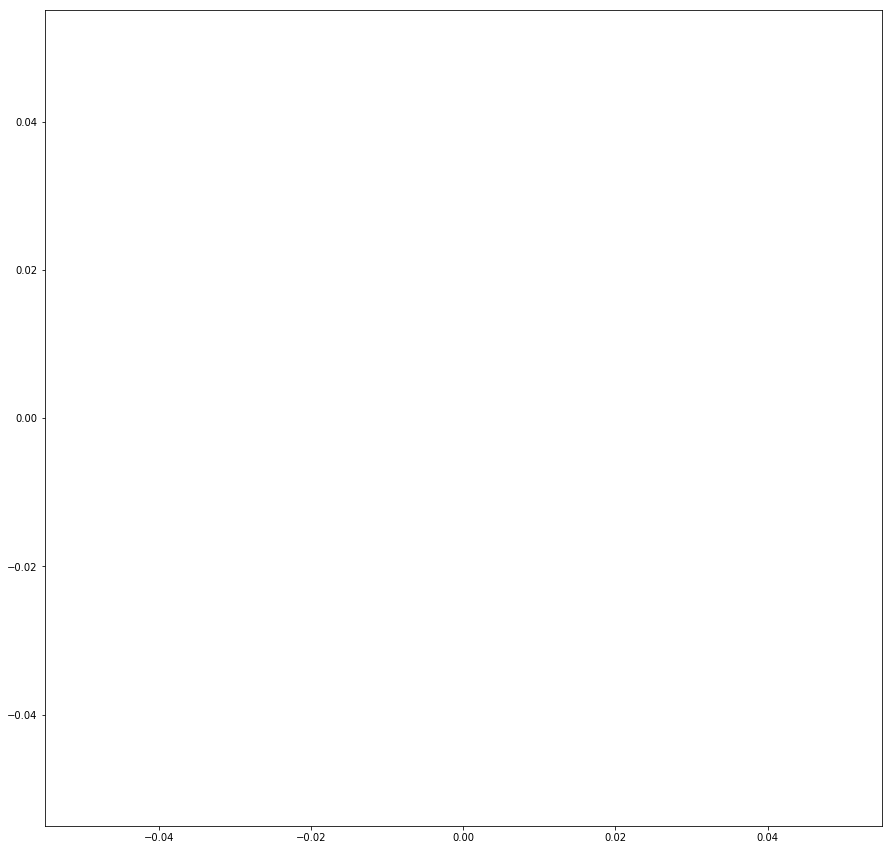

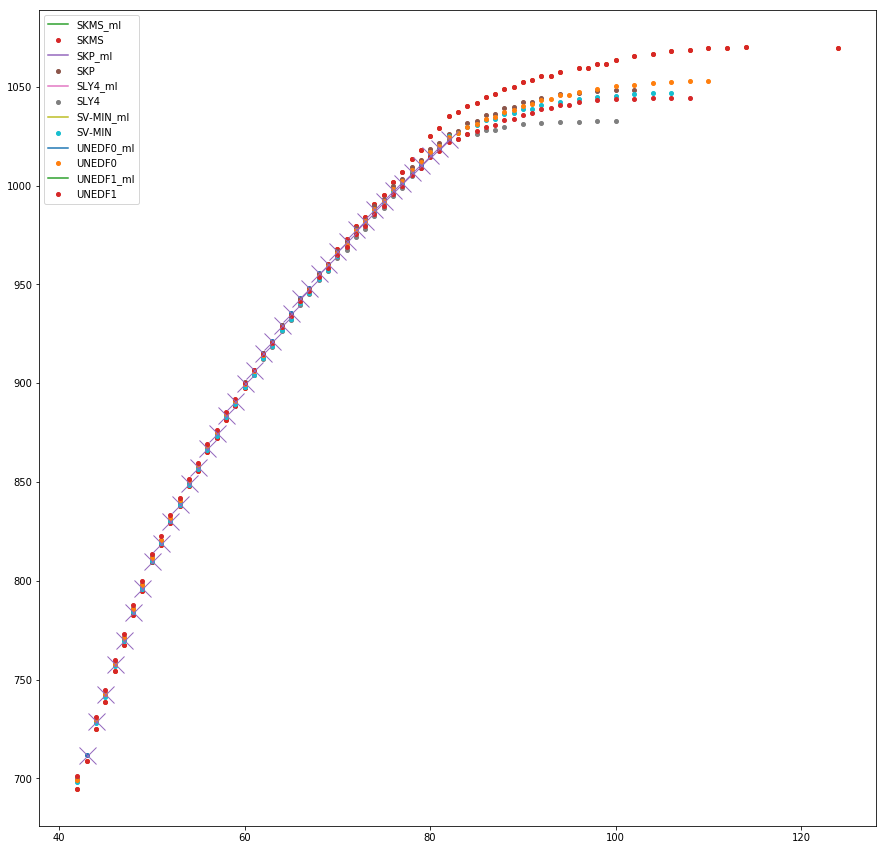

In [112]:
Sn_the_ml   =[[],[],[],[],[],[]]
Sn_ml       =[[],[],[],[],[],[]]

Sn_the      =[[],[],[],[],[],[]]
Sn_exp      =[]

n_Sn_the_ml =[[],[],[],[],[],[]]
n_Sn_the    =[[],[],[],[],[],[]]
n_Sn_exp    =[]

          
    
El_z=45

for i in range(0,6):
    #print(len(BE_T_ml_d[i]))
    #print(len(BE_T_d[i]))
    print(i)
    for n in range(0,200):
        try:
            BE_T_ml_d[i][n, El_z]  
            ml_comp_d[i][n, El_z]
            Sn_ml[i].append(ml_comp_d[i][n, El_z])
            #print(n, BE_T_ml_d[i][n, El_z]  )
            Sn_the_ml[i].append(BE_T_ml_d[i][n, El_z])  
            n_Sn_the_ml[i].append(n)  
        
        except KeyError:
            continue
            

for i in range(0,6):
    for n in range(0,200):
        try:
            the_energies_d[i][n, El_z][2]
            Sn_the[i].append(the_energies_d[i][n, El_z][2])
            n_Sn_the[i].append(n)
        
        except KeyError:
            continue
            
            

for n in range(0,200):
    try:
        exp_energies_d[n,El_z]
        Sn_exp.append(exp_energies_d[n,El_z])     
        n_Sn_exp.append(n)     
        
    except KeyError:
        continue
            
  
  
for i in range(0,6):
    plt.plot(n_Sn_the_ml[i], Sn_ml[i])#, "o", markersize=4)

plt.show()



plt.plot(n_Sn_exp, Sn_exp, "o", markersize=4)
for i in range(0,1):
    plt.plot(n_Sn_the[i], Sn_the[i], "o", markersize=4)
 

for i in range(0,6):
    plt.plot(n_Sn_the_ml[i], Sn_the_ml[i], label=name[i]+"_ml")#, "o", markersize=4)
    plt.plot(n_Sn_the[i], Sn_the[i], "o", markersize=4, label=name[i])
 

plt.plot(n_Sn_exp, Sn_exp, "x", markersize=17)
plt.legend()
plt.show()

    

1.5695470400000886
0.10506299999997282
-0.8138953000000129
0.09113500000012209
-1.3024243100001058
0.015456999999969412
-0.26581285000020216
0.1735479999999825
-0.3003111999998964
0.18190000000004147
0.7534529399999883
0.13756100000000515


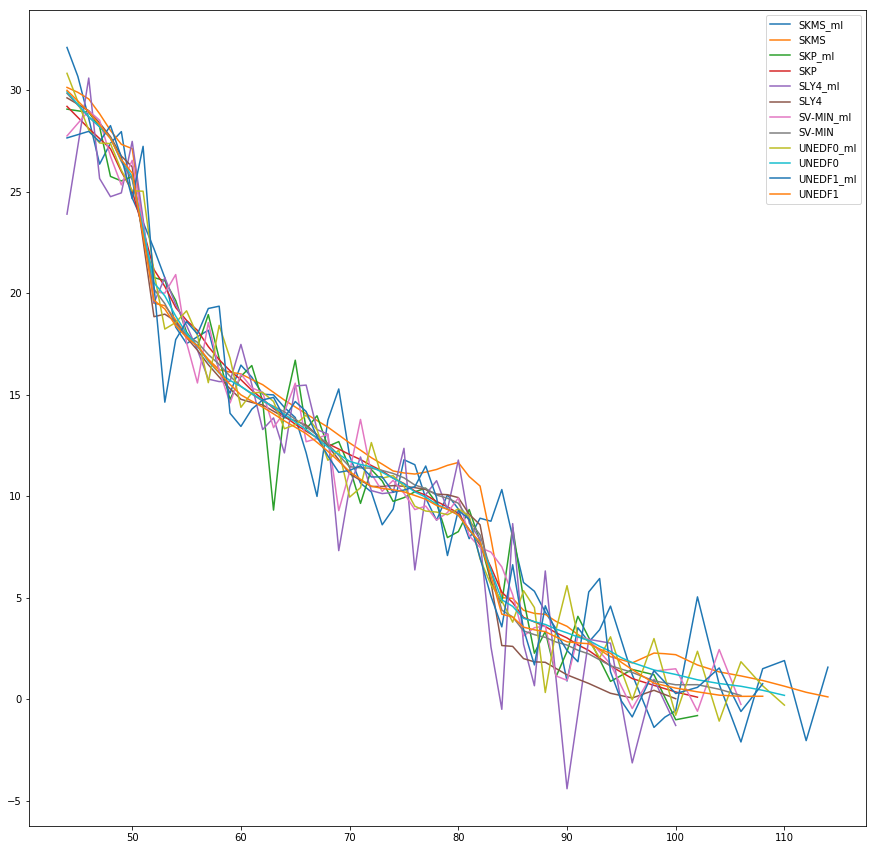

" \nEl_S_2n_ml=[[],[],[],[],[],[]]\nEl_z=28\nfor i in range(0,6):\n    for n in range(0,400):\n        try:\n            S_2n_all_the_d[i][n,El_z]\n            El_S_2n_ml[i].append((n, S_2n_all_the_d[i][n,El_z]))\n                    \n        except KeyError:\n            continue\n        \n\nfor i in range(0,6):\n    plt.plot(np.transpose(El_S_2n_ml[i])[0],np.transpose(El_S_2n_ml[i])[1],label=name[i]+'_ml')\n\nplt.legend()\nplt.show()\n"

In [71]:
S_2n_all_the_ml=[[],[],[], [],[],[]]
S_2n_all_the_ml_d=[{},{},{},{},{},{}]

for i in range(0,6):
    for n in range(2,400):
        for z in range(0,300):
            try:
                BE_T_ml_d[i][n, z] 
                BE_T_ml_d[i][n-2, z]
                
                S_2n_all_the_ml[i].append((n, z, BE_T_ml_d[i][n, z]-BE_T_ml_d[i][n-2, z], BE_T_d[i][n, z]-BE_T_d[i][n-2, z]))
                S_2n_all_the_ml_d[i][n,z]= (n, BE_T_ml_d[i][n, z]-BE_T_ml_d[i][n-2, z], BE_T_d[i][n, z]-BE_T_d[i][n-2, z])
            
            except KeyError:
                continue


El_S_2n_the_ml=[[],[],[],[],[],[]]
El_z=45
for i in range(0,6):
    for n in range(0,400):
        try:
            S_2n_all_the_ml_d[i][n,El_z]
            El_S_2n_the_ml[i].append(S_2n_all_the_ml_d[i][n,El_z])
             
        except KeyError:
            continue
            
        

for i in range(0,6):
    print(np.transpose(El_S_2n_the_ml[i])[1][-1])
    print(np.transpose(El_S_2n_the_ml[i])[2][-1])
    
    plt.plot(np.transpose(El_S_2n_the_ml[i])[0],np.transpose(El_S_2n_the_ml[i])[1],label=name[i]+'_ml')
    plt.plot(np.transpose(El_S_2n_the_ml[i])[0],np.transpose(El_S_2n_the_ml[i])[2],label=name[i])
plt.legend()
plt.show()  
                

                
"""
for i in range(0,6):
    ext = np.int(np.ceil(max(-np.min(np.transpose(S_2n_all_the[i])[2]),np.max(np.transpose(S_2n_all_the[i])[2]))))
    fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc = plt.scatter(np.transpose(S_2n_all_the[i])[0],np.transpose(S_2n_all_the[i])[1],c=np.transpose(S_2n_all_the[i])[2],cmap='PiYG',vmin=-ext,vmax=ext,s=5)
    #plt.plot(np.transpose(body_ndrip_NZ)[0],np.transpose(body_ndrip_NZ)[1], 'x', markersize=2)
    plt.title('all ml predictions of exp the difference')
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.colorbar(sc)
    plt.show()
   """ 
""" 
El_S_2n_ml=[[],[],[],[],[],[]]
El_z=28
for i in range(0,6):
    for n in range(0,400):
        try:
            S_2n_all_the_d[i][n,El_z]
            El_S_2n_ml[i].append((n, S_2n_all_the_d[i][n,El_z]))
                    
        except KeyError:
            continue
        

for i in range(0,6):
    plt.plot(np.transpose(El_S_2n_ml[i])[0],np.transpose(El_S_2n_ml[i])[1],label=name[i]+'_ml')

plt.legend()
plt.show()
""" 
            
            

# WORSE BROKEN DON'T GO PAST


In [21]:
rf_ZQ_name=["rf_ZQ_SKMS",
         "rf_ZQ_SKP",
         "rf_ZQ_SLY4",
         "rf_ZQ_SV-MIN",
         "rf_ZQ_UNEDF0",
         "rf_ZQ_UNEDF1",]


for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_range[i]=np.transpose(zdrip_range[i])
    ndrip_range[i]=np.transpose(ndrip_range[i])
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i]) 
    the_exp_mat_reduced_range[i]=np.transpose(the_exp_mat_reduced_range[i])    
    the_no_mat_range[i]=np.transpose(the_no_mat_range[i])
    the_range[i]=np.transpose(the_range[i])
    the_energies[i]=np.transpose(the_energies[i])
    
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    
    zdrip_nonan_energies[i]=np.transpose(zdrip_nonan_energies[i])              
    ndrip_nonan_energies[i]=np.transpose(ndrip_nonan_energies[i])
    the_exp_mat_reduced_nonan_energies[i]=np.transpose(the_exp_mat_reduced_nonan_energies[i])
    the_exp_mat_nonan_energies[i]=np.transpose(the_exp_mat_nonan_energies[i])
    the_no_mat_nonan_energies[i]=np.transpose(the_no_mat_nonan_energies[i])
    the_nonan_energies[i]=np.transpose(the_nonan_energies[i])
    
    
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++


BE_T_ml        =[[],[],[], [],[],[]]
BE_T_ml_d      =[{},{},{}, {},{},{}]
the_NZ         =[[],[],[], [],[],[]]
ml_comp        =[[],[],[], [],[],[]]
ml_comp_d      =[{},{},{}, {},{},{}]

for i in range(0,6):
    
    print(rf_ZQ_name[i])
    train_test_features=np.transpose(np.stack((the_exp_mat_reduced_range[i][1],the_exp_mat_reduced_range[i][5])))
    train_test_NZ      =np.transpose(np.stack((the_exp_mat_reduced_range[i][0],the_exp_mat_reduced_range[i][1])))
    train_test_target  =the_exp_mat_reduced_range[i][4]
    
    body_ndrip_features=np.transpose(np.stack((the_exp_mat_range[i][1],the_exp_mat_range[i][5])))
    body_ndrip_NZ      =np.transpose(np.stack((the_exp_mat_range[i][0],the_exp_mat_range[i][1])))
    body_ndrip_target  =the_exp_mat_range[i][4]
    
    ndrip_features     =np.transpose(np.stack((ndrip_range[i][1],ndrip_range[i][5])))
    ndrip_NZ           =np.transpose(np.stack((ndrip_range[i][0],ndrip_range[i][1])))
    ndrip_target       =ndrip_range[i][4]
    
    features           =np.transpose(np.stack((the_range[i][1],the_range[i][3])))
    the_NZ[i]          =np.transpose(np.stack((the_range[i][0],the_range[i][1])))
    the_BE             =the_range[i][2]
    
    BE_T_ml[i]=t_be_improve(train_test_features,
                          train_test_target,
                          train_test_NZ,
                          ndrip_features,
                          ndrip_target,
                          ndrip_NZ,
                          features,
                          the_BE,
                          the_NZ[i],
                          body_ndrip_features,
                          body_ndrip_target,
                          body_ndrip_NZ)
    
    """
    ml_comp[i]=ml_predict(train_test_features,
                          train_test_target,
                          train_test_NZ,
                          ndrip_features,
                          ndrip_target,
                          ndrip_NZ,
                          features,
                          the_BE,
                          the_NZ[i],
                          body_ndrip_features,
                          body_ndrip_target,
                          body_ndrip_NZ)
    """
    
    
    
    
    for j in range(0,len(the_NZ[i])):
        BE_T_ml_d[i][the_NZ[i][j][0],the_NZ[i][j][1]]=BE_T_ml[i][j]
        #ml_comp_d[i][the_NZ[i][j][0],the_NZ[i][j][1]]=ml_comp[i][j]
    
    
    

    

    
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_range[i]=np.transpose(zdrip_range[i])
    ndrip_range[i]=np.transpose(ndrip_range[i])
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i]) 
    the_exp_mat_reduced_range[i]=np.transpose(the_exp_mat_reduced_range[i])    
    the_no_mat_range[i]=np.transpose(the_no_mat_range[i])
    the_range[i]=np.transpose(the_range[i])
    the_energies[i]=np.transpose(the_energies[i])
    
     
    
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    
    
    zdrip_nonan_energies[i]=np.transpose(zdrip_nonan_energies[i])              
    ndrip_nonan_energies[i]=np.transpose(ndrip_nonan_energies[i])
    the_exp_mat_reduced_nonan_energies[i]=np.transpose(the_exp_mat_reduced_nonan_energies[i])
    the_exp_mat_nonan_energies[i]=np.transpose(the_exp_mat_nonan_energies[i])
    the_no_mat_nonan_energies[i]=np.transpose(the_no_mat_nonan_energies[i])
    the_nonan_energies[i]=np.transpose(the_nonan_energies[i])
    
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    



rf_ZQ_SKMS
features:          (2350, 2)
target:            (2350,)
ndrip_features:    (219, 2)
ndrip_target:      (219,)
all_the_features:  (5241, 2)
all_the_values:    (5241,)
training score:  0.9780892033887777
testing score:   0.8193063024785195
full score:      0.9394069261938051
ndrip score:      0.5907817326272112 


train sqrd mean sqrd error:       0.8019180791178219
test sqrd mean sqrd error:        2.262628347441537
all body sqrd mean sqrd error:    1.3278285440810085
ndrip sqrd mean sqrd error:       3.447716744667878 


rf_ZQ_SKP
features:          (2382, 2)
target:            (2382,)
ndrip_features:    (219, 2)
ndrip_target:      (219,)
all_the_features:  (4659, 2)
all_the_values:    (4659,)
training score:  0.9800306079064731
testing score:   0.8419624294517434
full score:      0.9457569334139249
ndrip score:      0.853701969569674 


train sqrd mean sqrd error:       0.35121658639883924
test sqrd mean sqrd error:        0.983233315090716
all body sqrd mean sqrd error:   

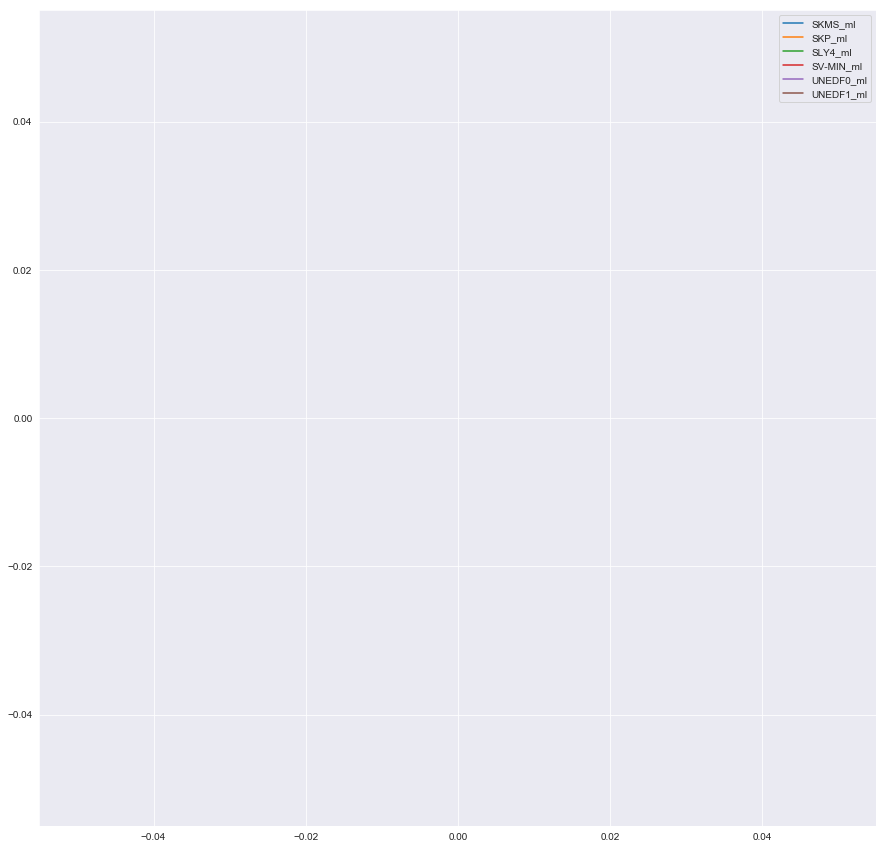

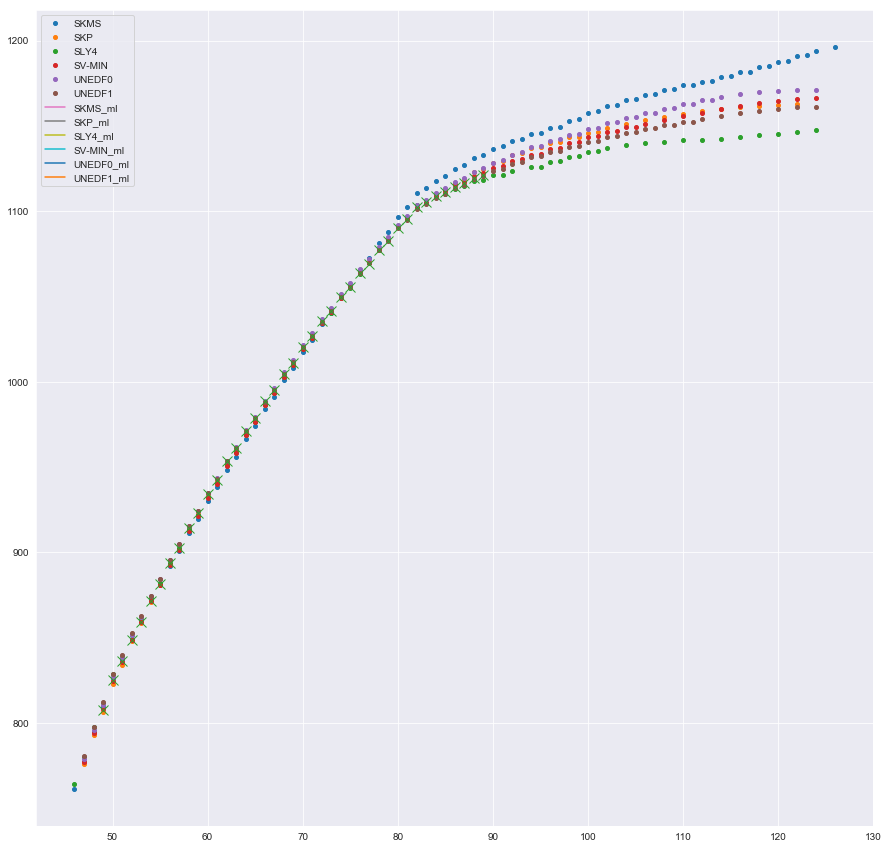

In [22]:
Sn_the_ml   =[[],[],[],[],[],[]]
Sn_ml       =[[],[],[],[],[],[]]

Sn_the      =[[],[],[],[],[],[]]
Sn_exp      =[]

n_Sn_the_ml =[[],[],[],[],[],[]]
n_Sn_the    =[[],[],[],[],[],[]]
n_Sn_exp    =[]

          
            

for i in range(0,6):
    for n in range(0,200):
        try:
            BE_T_ml_d[i][n, 50]  
            ml_comp_d[i][n, 50]
            Sn_ml[i].append(ml_comp_d[i][n, 50])
            Sn_the_ml[i].append(BE_T_ml_d[i][n, 50])  
            n_Sn_the_ml[i].append(n)  
        
        except KeyError:
            continue
            

for i in range(0,6):
    for n in range(0,200):
        try:
            the_energies_d[i][n, 50][2]
            Sn_the[i].append(the_energies_d[i][n, 50][2])
            n_Sn_the[i].append(n)
        
        except KeyError:
            continue
            
            

for n in range(0,200):
    try:
        exp_energies_d[n,50]
        Sn_exp.append(exp_energies_d[n,50])     
        n_Sn_exp.append(n)     
        
    except KeyError:
        continue
            
  
  
for i in range(0,6):
    plt.plot(n_Sn_the_ml[i], Sn_ml[i], label=name[i]+"_ml")#, "o", markersize=4)


plt.legend()
plt.show()



for i in range(0,6):
    plt.plot(n_Sn_the[i], Sn_the[i], "o", markersize=4, label=name[i])
    
for i in range(0,6):
    plt.plot(n_Sn_the_ml[i], Sn_the_ml[i], label=name[i]+"_ml")#, "o", markersize=4)

plt.plot(n_Sn_exp, Sn_exp, "x", markersize=10)
plt.legend()
plt.show()

    

In [148]:
rf_ZQ_name=["rf_ZQ_SKMS",
         "rf_ZQ_SKP",
         "rf_ZQ_SLY4",
         "rf_ZQ_SV-MIN",
         "rf_ZQ_UNEDF0",
         "rf_ZQ_UNEDF1",]


for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_range[i]=np.transpose(zdrip_range[i])
    ndrip_range[i]=np.transpose(ndrip_range[i])
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i]) 
    the_exp_mat_reduced_range[i]=np.transpose(the_exp_mat_reduced_range[i])    
    the_no_mat_range[i]=np.transpose(the_no_mat_range[i])
    the_range[i]=np.transpose(the_range[i])
    the_energies[i]=np.transpose(the_energies[i])
    
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    
    zdrip_nonan_energies[i]=np.transpose(zdrip_nonan_energies[i])              
    ndrip_nonan_energies[i]=np.transpose(ndrip_nonan_energies[i])
    the_exp_mat_reduced_nonan_energies[i]=np.transpose(the_exp_mat_reduced_nonan_energies[i])
    the_exp_mat_nonan_energies[i]=np.transpose(the_exp_mat_nonan_energies[i])
    the_no_mat_nonan_energies[i]=np.transpose(the_no_mat_nonan_energies[i])
    the_nonan_energies[i]=np.transpose(the_nonan_energies[i])
    
    
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++


BE_T_ml        =[[],[],[], [],[],[]]
BE_T_ml_d      =[{},{},{}, {},{},{}]
the_NZ         =[[],[],[], [],[],[]]
ml_comp        =[[],[],[], [],[],[]]
ml_comp_d      =[{},{},{}, {},{},{}]

for i in range(0,6):
    
    print(rf_ZQ_name[i])
    train_test_features=np.transpose(np.stack((the_exp_mat_nonan_energies[i][1]+the_exp_mat_nonan_energies[i][0],the_exp_mat_nonan_energies[i][5])))
    train_test_NZ      =np.transpose(np.stack((the_exp_mat_nonan_energies[i][1],the_exp_mat_nonan_energies[i][0])))
    train_test_target  =the_exp_mat_nonan_energies[i][4]
    
    body_ndrip_features=np.transpose(np.stack((the_exp_mat_nonan_energies[i][1]+the_exp_mat_nonan_energies[i][0],the_exp_mat_nonan_energies[i][5])))
    body_ndrip_NZ      =np.transpose(np.stack((the_exp_mat_nonan_energies[i][0],the_exp_mat_nonan_energies[i][1])))
    body_ndrip_target  =the_exp_mat_nonan_energies[i][4]
    
    ndrip_features     =np.transpose(np.stack((ndrip_nonan_energies[i][1]+ndrip_nonan_energies[i][0],ndrip_nonan_energies[i][5])))
    ndrip_NZ           =np.transpose(np.stack((ndrip_nonan_energies[i][0],ndrip_nonan_energies[i][1])))
    ndrip_target       =ndrip_nonan_energies[i][4]
    
    features           =np.transpose(np.stack((the_nonan_energies[i][1]+the_nonan_energies[i][0],the_nonan_energies[i][3])))
    the_NZ[i]          =np.transpose(np.stack((the_nonan_energies[i][0],the_nonan_energies[i][1])))
    the_BE             =the_nonan_energies[i][2]
    
    
    
    BE_T_ml[i]=t_be_improve(train_test_features,
                          train_test_target,
                          train_test_NZ,
                          ndrip_features,
                          ndrip_target,
                          ndrip_NZ,
                          features,
                          the_BE,
                          the_NZ[i],
                          body_ndrip_features,
                          body_ndrip_target,
                          body_ndrip_NZ)
    
    """
    ml_comp[i]=ml_predict(train_test_features,
                          train_test_target,
                          train_test_NZ,
                           ndrip_features,
                          ndrip_target,
                          ndrip_NZ,
                          features,
                          the_BE,
                          the_NZ[i],
                          body_ndrip_features,
                         body_ndrip_target,
                          body_ndrip_NZ)"""
    
    
    
    
    
    for j in range(0,len(the_NZ[i])):
        BE_T_ml_d[i][the_NZ[i][j][0],the_NZ[i][j][1]]=BE_T_ml[i][j]
        #ml_comp_d[i][the_NZ[i][j][0],the_NZ[i][j][1]]=ml_comp[i][j]
    
    
    

    

    
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
#^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#++++++++++++++++++++++++++++++++++++++++++++++++
for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_range[i]=np.transpose(zdrip_range[i])
    ndrip_range[i]=np.transpose(ndrip_range[i])
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i]) 
    the_exp_mat_reduced_range[i]=np.transpose(the_exp_mat_reduced_range[i])    
    the_no_mat_range[i]=np.transpose(the_no_mat_range[i])
    the_range[i]=np.transpose(the_range[i])
    the_energies[i]=np.transpose(the_energies[i])
    
     
    
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i])    
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    
    
    zdrip_nonan_energies[i]=np.transpose(zdrip_nonan_energies[i])              
    ndrip_nonan_energies[i]=np.transpose(ndrip_nonan_energies[i])
    the_exp_mat_reduced_nonan_energies[i]=np.transpose(the_exp_mat_reduced_nonan_energies[i])
    the_exp_mat_nonan_energies[i]=np.transpose(the_exp_mat_nonan_energies[i])
    the_no_mat_nonan_energies[i]=np.transpose(the_no_mat_nonan_energies[i])
    the_nonan_energies[i]=np.transpose(the_nonan_energies[i])
    
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
  

rf_ZQ_SKMS
features:          (3257, 2)
target:            (3257,)
ndrip_features:    (345, 2)
ndrip_target:      (345,)
all_the_features:  (8687, 2)
all_the_values:    (8687,)
training score:  0.9911524951072762
testing score:   0.9248637804903851
full score:      0.9741224818427255
ndrip score:      0.9834106176646942 


train sqrd mean sqrd error:       0.6205112935029047
test sqrd mean sqrd error:        1.8428091141181047
all body sqrd mean sqrd error:    1.0669842497034079
ndrip sqrd mean sqrd error:       1.0815215515604586 


rf_ZQ_SKP
features:          (3277, 2)
target:            (3277,)
ndrip_features:    (345, 2)
ndrip_target:      (345,)
all_the_features:  (7465, 2)
all_the_values:    (7465,)
training score:  0.9914258632862167
testing score:   0.9469905539181429
full score:      0.9794304840097904
ndrip score:      0.9916321150290363 


train sqrd mean sqrd error:       0.3068310722116675
test sqrd mean sqrd error:        0.8039191983718077
all body sqrd mean sqrd error:

# END OF RF application

# Graphs

In [60]:
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#GRAPHS
#GRAPHS
#GRAPHS
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$



#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!    
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
exp_energies=np.transpose(exp_energies)
exp_range=np.transpose(exp_range)
for i in range(0,6):
    the_energies[i]=np.transpose(the_energies[i])
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    exp_the_mat_energies[i]=np.transpose(exp_the_mat_energies[i])
    the_range[i]=np.transpose(the_range[i])
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!    
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!



for i in range(0,6):
    """
    ext = np.int(np.ceil(max(the_energies[i][2])))
    fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc = plt.scatter(the_energies[i][1],the_energies[i][0],c=the_energies[i][2],cmap='Blues',vmax=ext,s=10)
    plt.colorbar(sc)
    plt.title(the_names[i]+" Theoretical Binding Energies")
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')   
    plt.show()

    
    
    ext = np.int(np.ceil(max(the_range[i][2])))
    fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc = plt.scatter(the_range[i][1],the_range[i][0],c=the_range[i][2],cmap='Blues',vmax=ext,s=10)
    plt.colorbar(sc)
    plt.title(the_names[i]+" Theoretical Binding Energies")
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')   
    plt.show()
    """
    
    #plt.plot(the_energies[i][0],the_energies[i][1], "+", markersize=5, label='theoretical energies')
    plt.plot(the_no_mat_energies[i][0],the_no_mat_energies[i][1], "+", markersize=5, label='the no mat energies')
    plt.plot(exp_the_mat_energies[i][0],exp_the_mat_energies[i][1], "+", markersize=5, label='the no mat energies')
    
    #plt.plot(the_range[i][0],the_range[i][1], "x", markersize=4, label='theoretical range')
    #plt.plot(exp_energies[0],exp_energies[1], "+", markersize=5, label='Experimental energies')
    #plt.plot(exp_range[0],exp_range[1], "x", markersize=4, label='Experimental range')
    plt.title(the_names[i])
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.grid(True)
    plt.legend()
    plt.show()

    
    
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!    
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
exp_energies=np.transpose(exp_energies)
exp_range=np.transpose(exp_range)
for i in range(0,6):
    the_energies[i]=np.transpose(the_energies[i])
    the_no_mat_energies[i]=np.transpose(the_no_mat_energies[i])
    the_range[i]=np.transpose(the_range[i])
    exp_the_mat_energies[i]=np.transpose(exp_the_mat_energies[i])
    
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!    
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!




NameError: name 'exp_the_mat_energies' is not defined

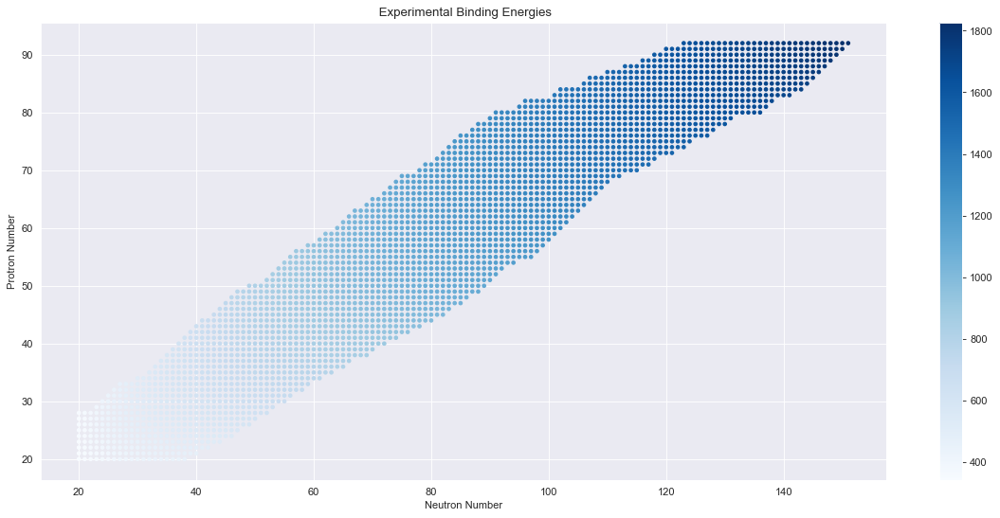

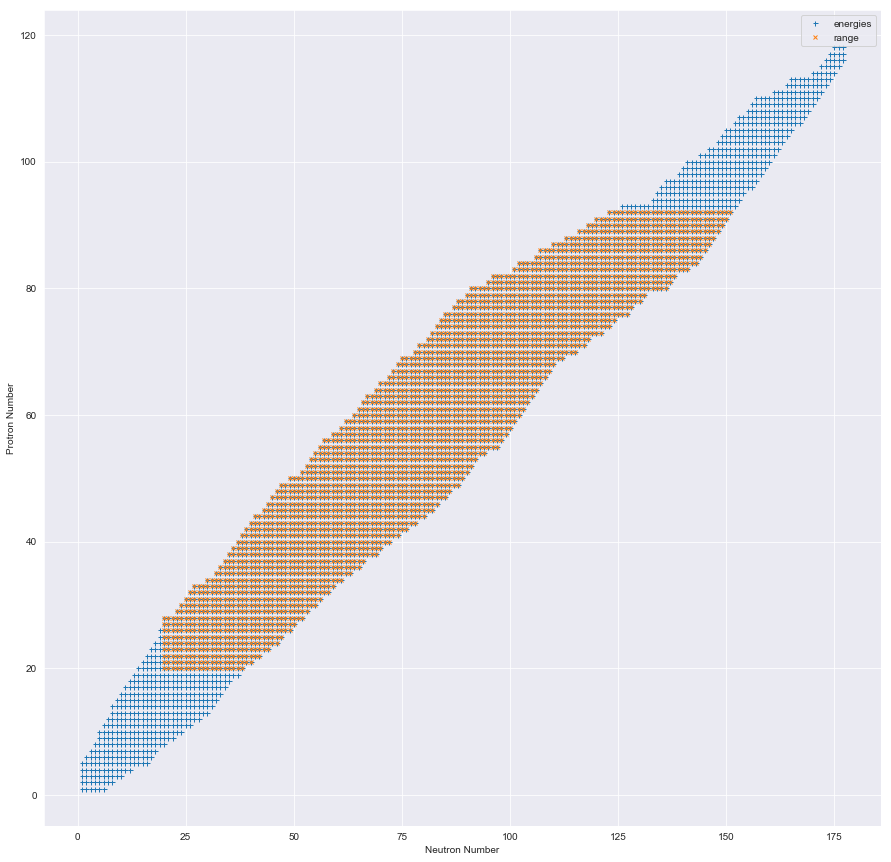

In [467]:
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#GRAPHS
#GRAPHS
#GRAPHS
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$

exp_range=np.transpose(exp_range)
exp_energies=np.transpose(exp_energies)

ext = np.int(np.ceil(max(exp_range[2])))
fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
sc = plt.scatter(exp_range[0],exp_range[1],c=exp_range[2],cmap='Blues',vmax=ext,s=10)
plt.colorbar(sc)
plt.title(" Experimental Binding Energies")
plt.xlabel('Neutron Number')
plt.ylabel('Protron Number')   
plt.show()

plt.plot(exp_energies[0],exp_energies[1], "+", markersize=5, label='energies')
plt.plot(exp_range[0],exp_range[1], "x", markersize=4, label='range')
plt.xlabel('Neutron Number')
plt.ylabel('Protron Number')
plt.grid(True)
plt.legend()
plt.show()

exp_range=np.transpose(exp_range)
exp_energies=np.transpose(exp_energies)


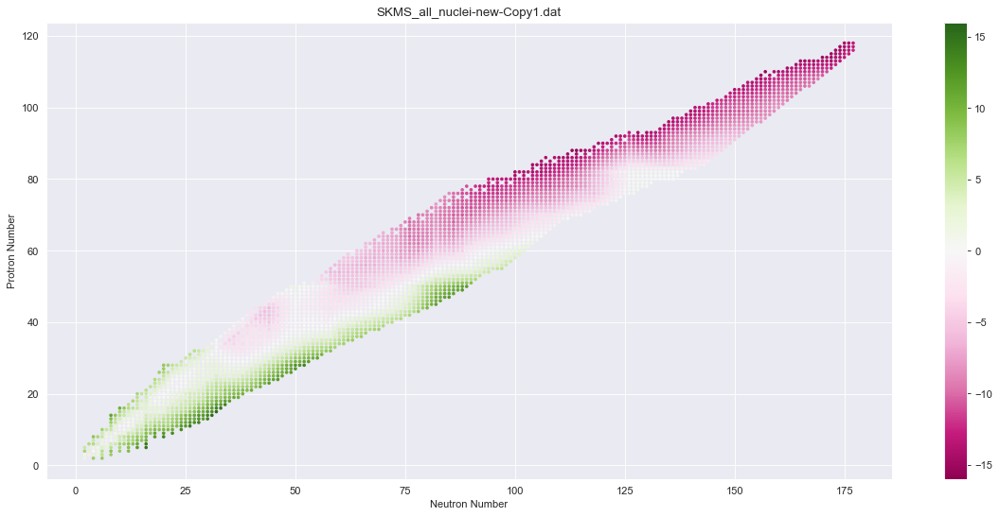

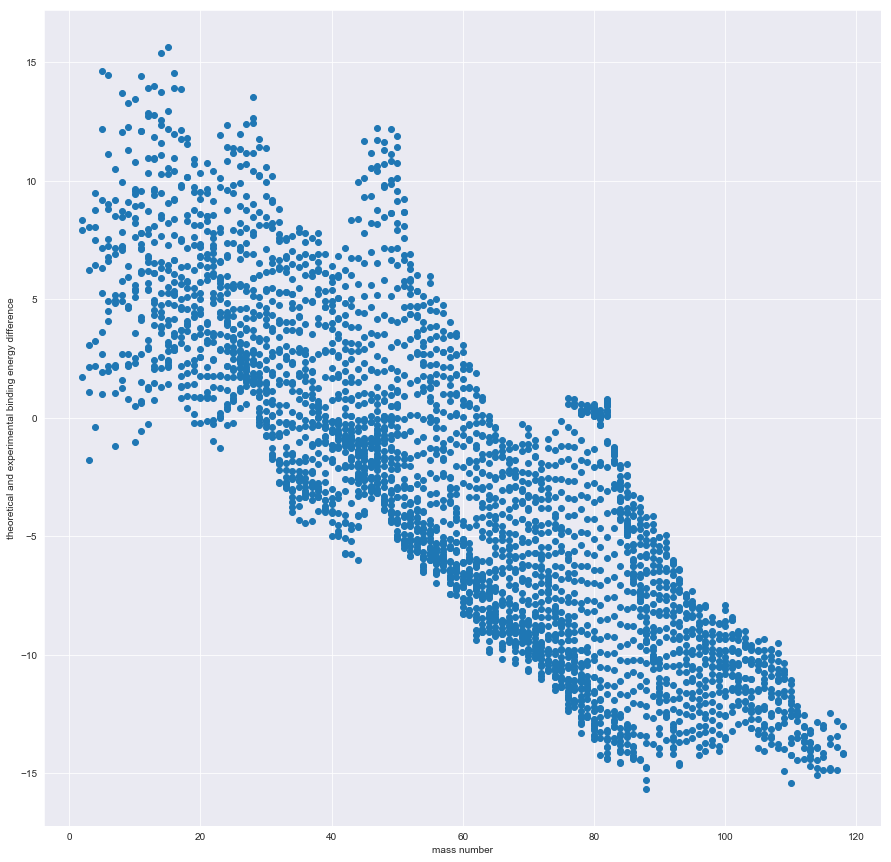

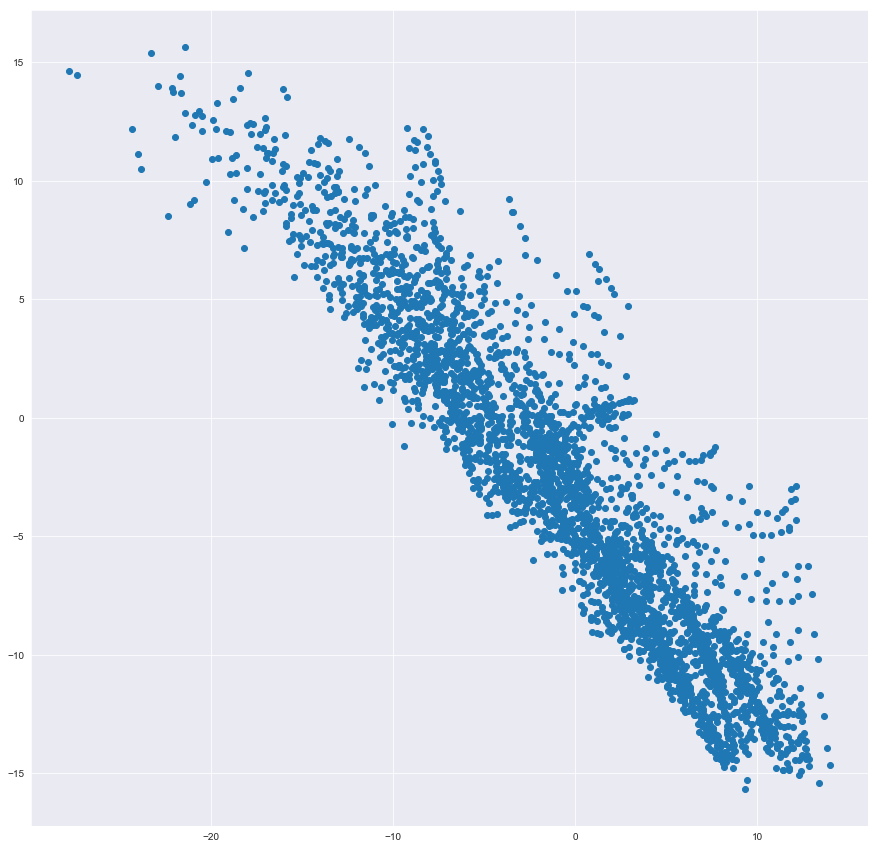

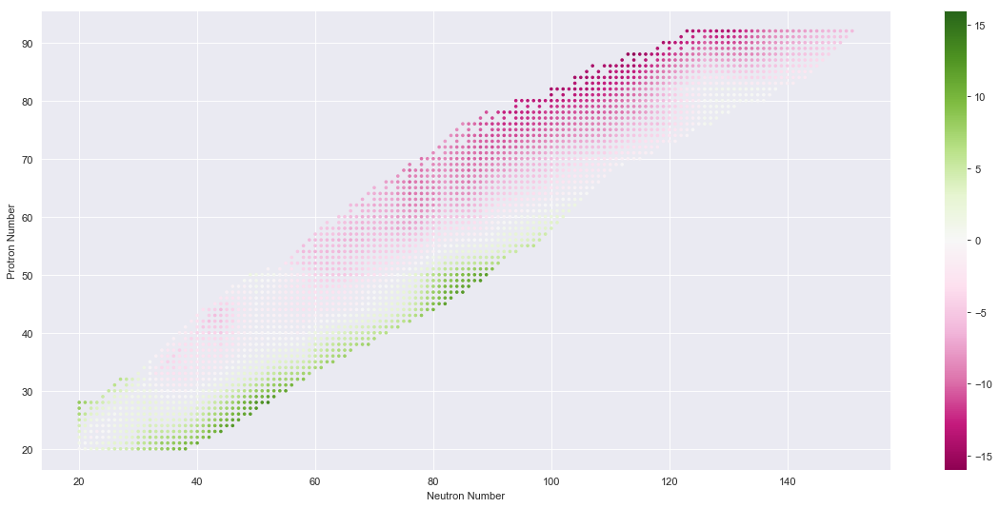

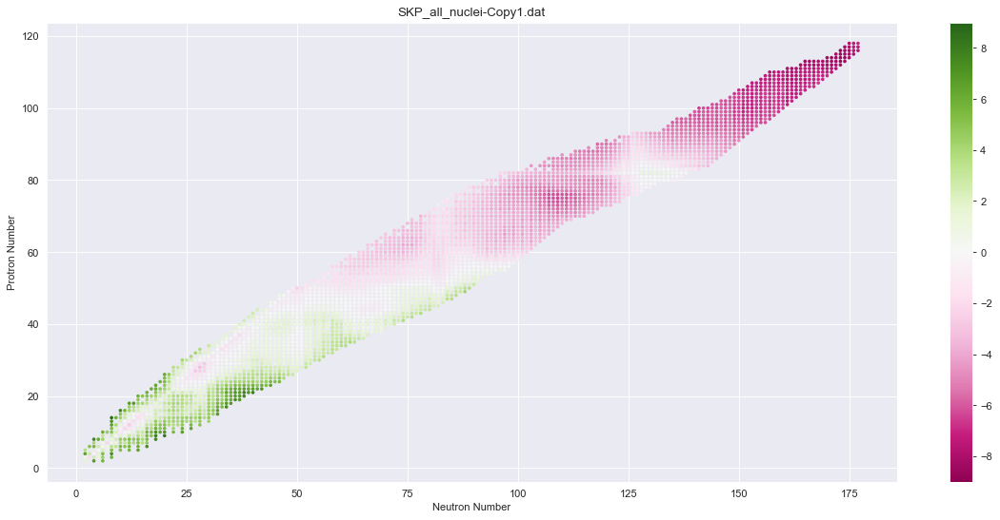

...

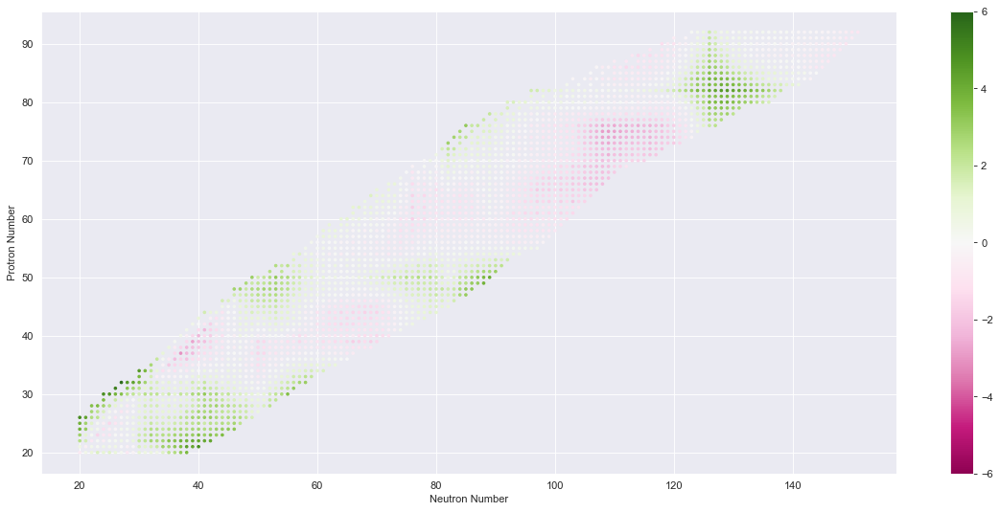

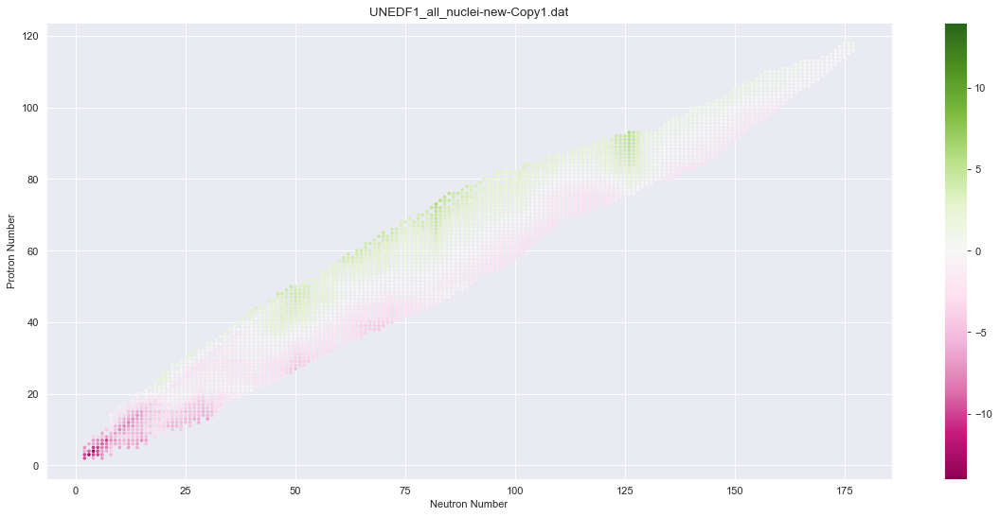

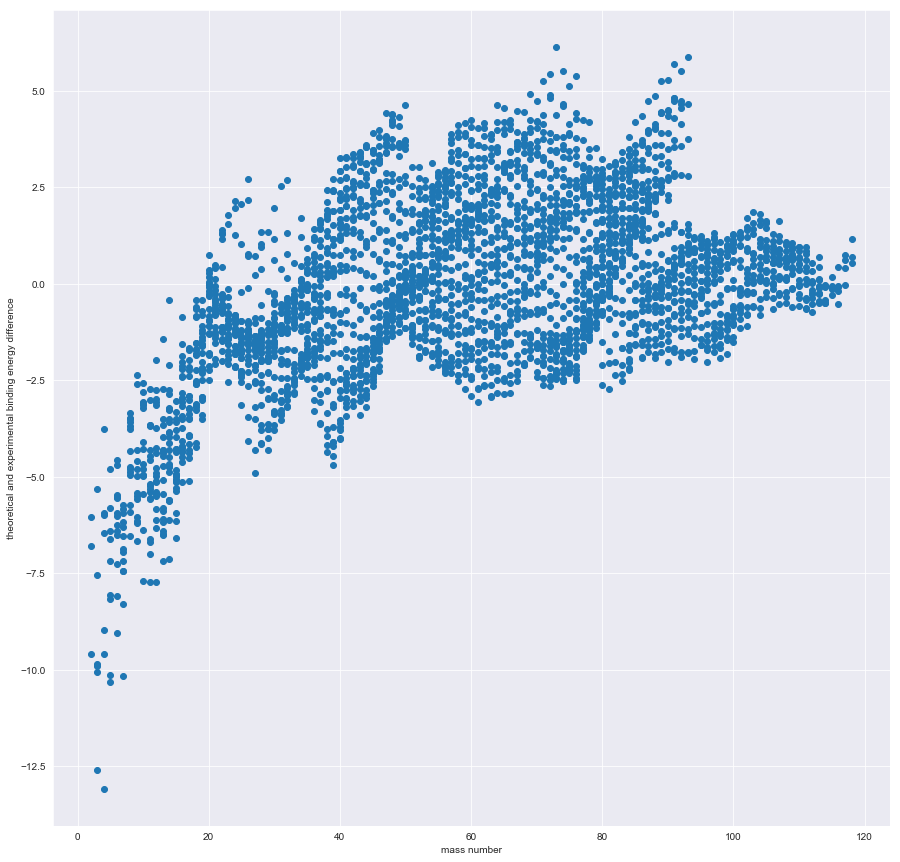

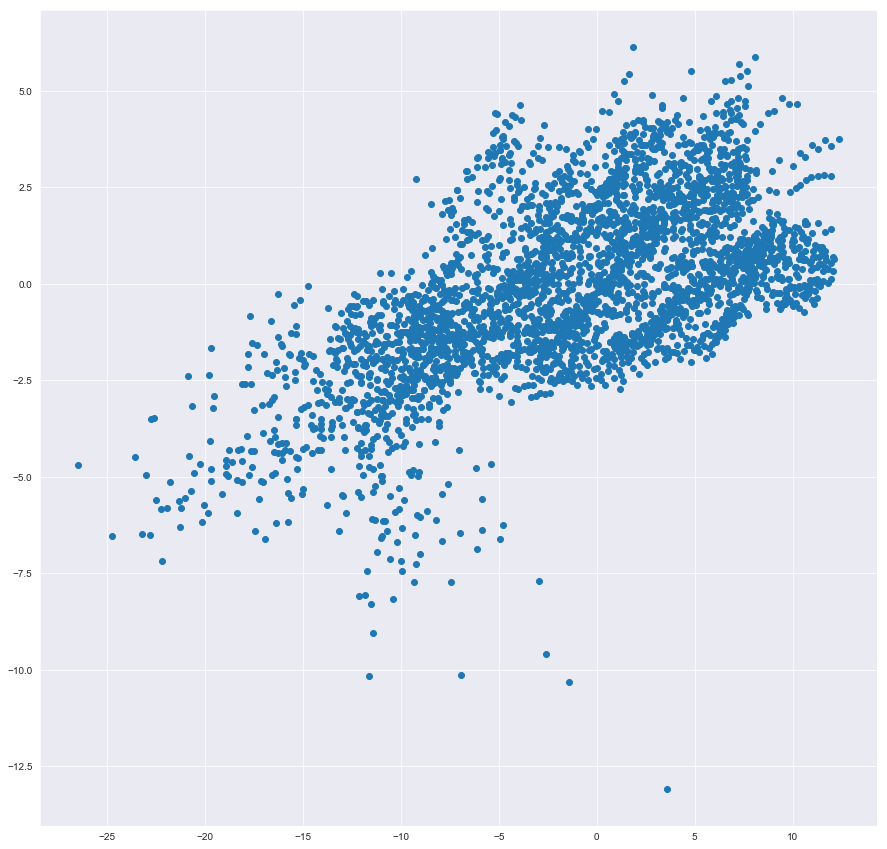

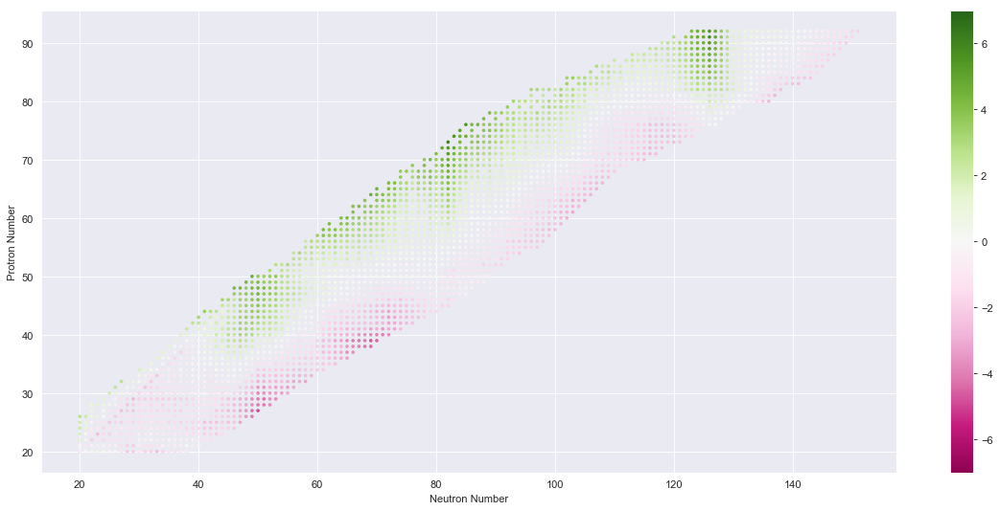

In [468]:
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#GRAPHS
#GRAPHS
#GRAPHS
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$


for i in range(0,6):
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i])
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i])
    
    
    
    ext = np.int(np.ceil(max(-np.min(the_exp_mat_energies[i][4]),np.max(the_exp_mat_energies[i][4]))))
    fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc = plt.scatter(the_exp_mat_energies[i][0],the_exp_mat_energies[i][1],c=the_exp_mat_energies[i][4],cmap='PiYG',vmin=-ext,vmax=ext,s=5)
    plt.title(the_names[i])
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.colorbar(sc)
    plt.show()
    
    
    plt.plot(the_exp_mat_energies[i][1], the_exp_mat_energies[i][4], 'o')
    plt.ylabel("theoretical and experimental binding energy difference")
    plt.xlabel("mass number")
    plt.show()
    
    plt.plot(the_exp_mat_energies[i][5],the_exp_mat_energies[i][4], 'o')
    plt.show()
    
    
    
    ext = np.int(np.ceil(max(-np.min(the_exp_mat_range[i][4]),np.max(the_exp_mat_range[i][4]))))
    fig=plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc = plt.scatter(the_exp_mat_range[i][0],the_exp_mat_range[i][1],c=the_exp_mat_range[i][4],cmap='PiYG',vmin=-ext,vmax=ext,s=5)
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.colorbar(sc)
    plt.show()
    
    
    print("\n\n\n\n")
    
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i])
    the_exp_mat_range[i]=np.transpose(the_exp_mat_range[i])
    
    
    

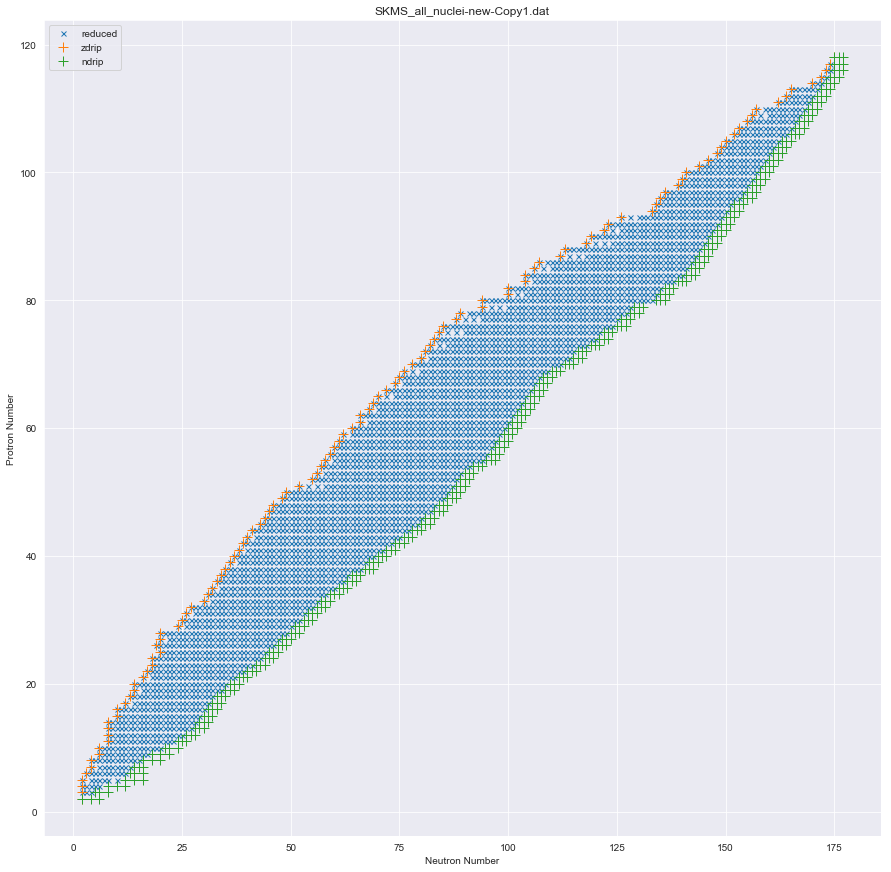

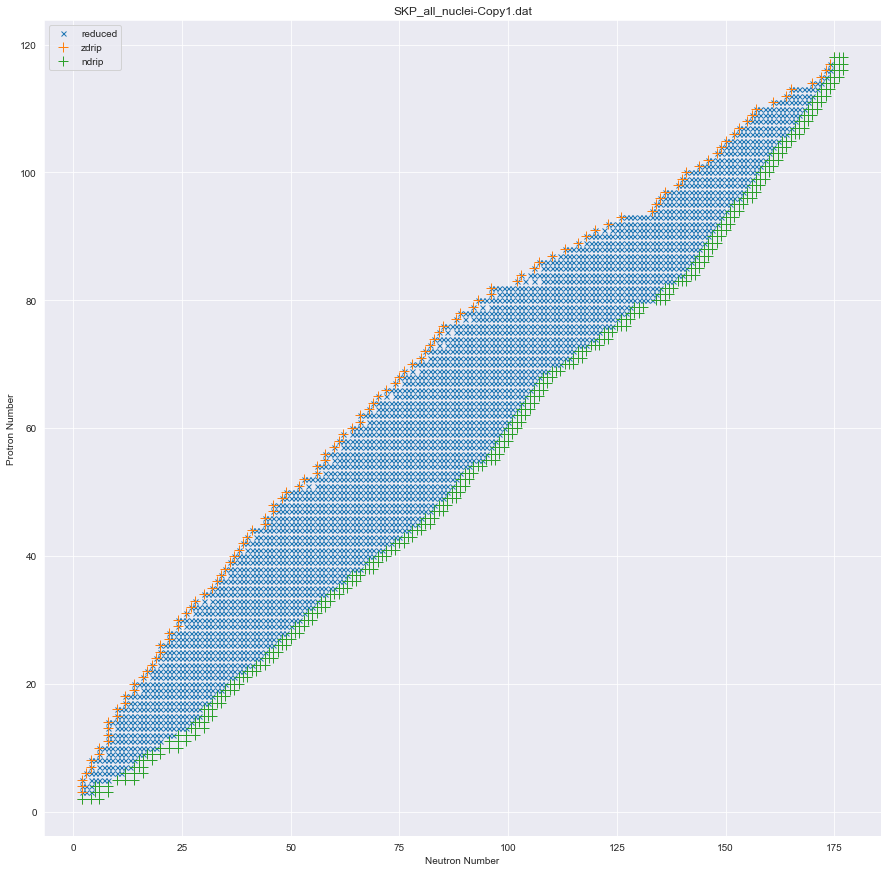

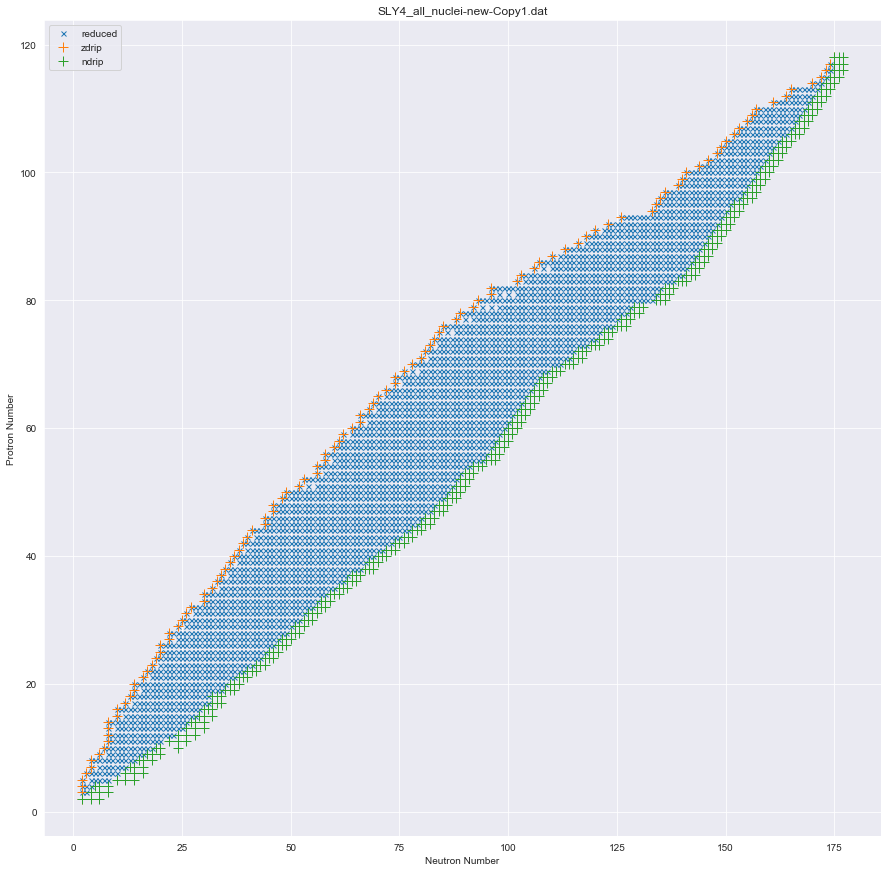

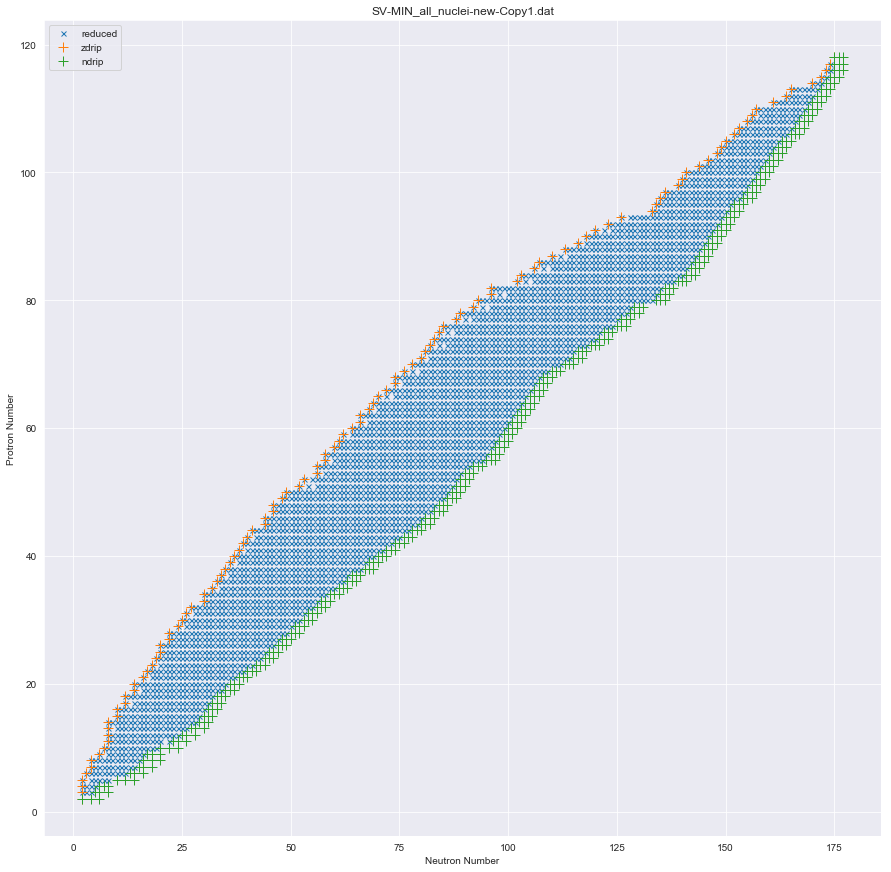

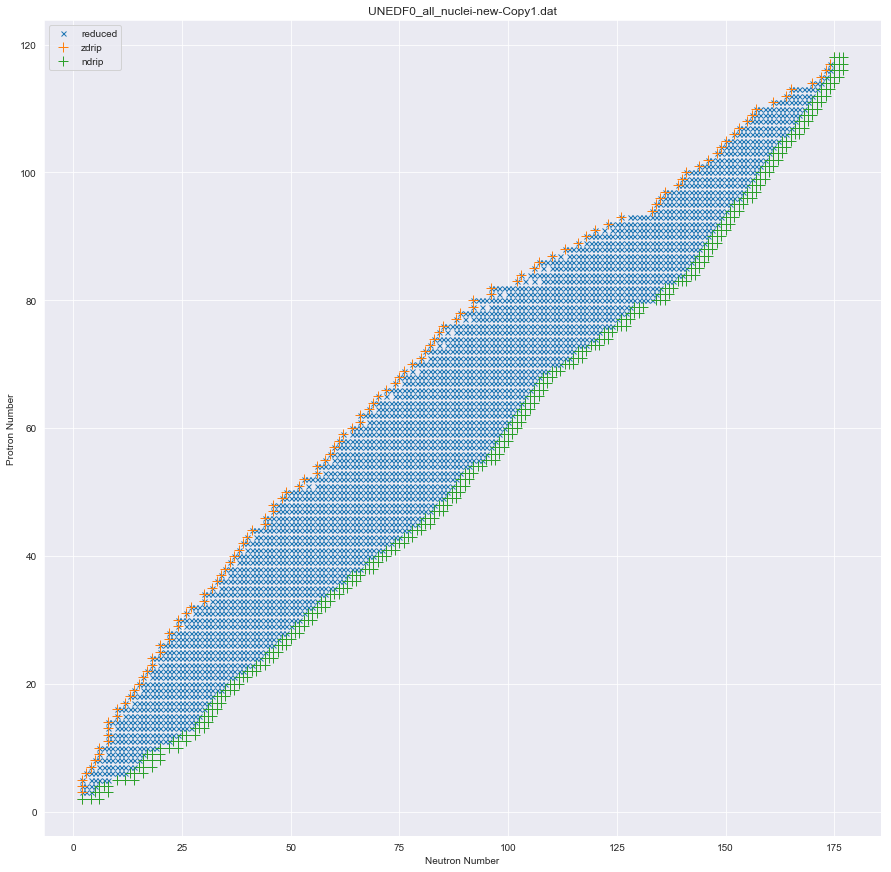

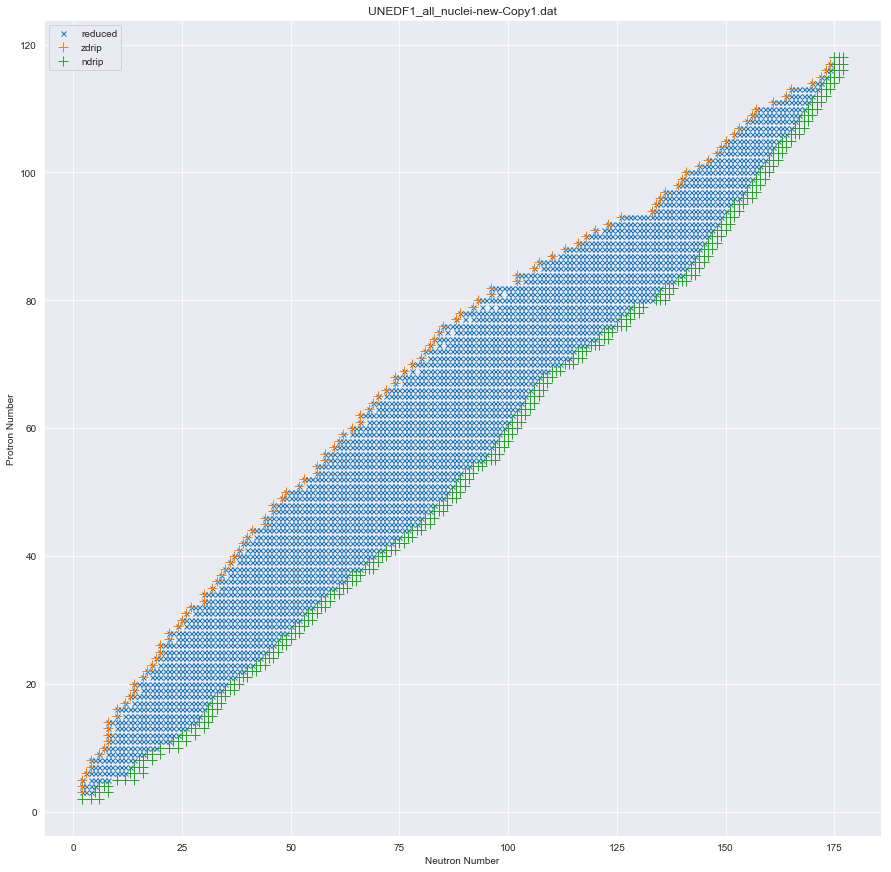

In [469]:
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#GRAPHS
#GRAPHS
#GRAPHS
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$


for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i]) 
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
  


for i in range(0,6):
    #plt.plot(the_exp_mat_energies[i][0],the_exp_mat_energies[i][1], "x", markersize=5, label='all')
    plt.plot(the_exp_mat_reduced_energies[i][0],the_exp_mat_reduced_energies[i][1], "x", markersize=5, label='reduced')
    
    plt.plot(zdrip_energies[i][0],zdrip_energies[i][1], "+", markersize=10, label='zdrip')
    plt.plot(ndrip_energies[i][0],ndrip_energies[i][1], "+", markersize=10, label='ndrip')
    
    
    
    plt.title(the_names[i])
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.grid(True)
    plt.legend()
    plt.show()

for i in range(0,6):
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    zdrip_energies[i]=np.transpose(zdrip_energies[i])
    ndrip_energies[i]=np.transpose(ndrip_energies[i])
    the_exp_mat_energies[i]=np.transpose(the_exp_mat_energies[i]) 
    the_exp_mat_reduced_energies[i]=np.transpose(the_exp_mat_reduced_energies[i]) 
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
  
